<a href="https://colab.research.google.com/github/AidenJiang01/WebScraping_TextMining/blob/main/GAA_Patent_Inventor_Network.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

這個筆記本是一個「專利--發明人」網絡的分析範例。

「專利--發明人」網絡是指由專利以及專利的發明人所形成的網絡，不同的專利間可能透過相同的發明人產生連結。當這種情況在一個技術類別的專利之間變得很興盛時，就會形成具有複雜結構的關係網絡。

在這個網絡中，發明人之間透過參與相同的專利之發明而產生關係，有些發明人透過許多專利和許多其他發明人產生關係，另一些發明人可能沒有和任何發明人產生關係。發明人在網絡上的位置有許多差異性，這些差異性可以做為特定發明人在這個技術領域中的重要性的參考指標，而透過網絡分析方法將可以幫助我們從這些網絡資料中挖掘出重要的資訊。

除了微觀的分析發明人位置之外，網絡分析也可以進行宏觀的結構分析。針對一個特定技術領域而蒐集的專利，建構專利發明人網絡，這個網絡可以反映出許多技術領域發展狀態的資訊，尤其是當我們可以比較不同時間點的網絡結構變化時，這樣的分析就更具意義。透過簡單的專利數與發明人數的數量變化，當然也可以描繪出概略的技術領域的發展趨勢，但透過網絡分析將可以更深入探索技術領域內的結構變化，例如專利發明人的合作型態在不同技術發展階段的演變。

這個筆記本所使用的範例資料是以"Gate-All-Around"作為關鍵字在Google專利搜尋上進行搜尋與篩選而得到的專利資料檔案。取其中專利以及發明人的資料來建構主要進行分析的網絡。相同的資料蒐集、處理與分析方法都可以應用到任何其他領域的專利資料上，甚至也可以應用到其他非專利的文獻資料上。

# 準備資料檔與所需套件

In [ ]:
getwd()

# upload GAA_patents_clean.csv to working directory

[1] "/content"

GAA_patents_clean.csv檔案是在另外的地方準備好的，裏頭是關於"Gate-All-Around"相關的專利，詳細請見:https://github.com/AidenJiang01/WebScraping_TextMining/blob/main/WebscrapingAndAPI_PatentCitationData.ipynb

In [ ]:
df <- read.csv("GAA_patents_clean.csv")

# Convert the integer date column to character
df$filing_date <- as.character(df$filing_date)

# Extract the first four characters to get the year
df$filing_year <- substr(df$filing_date, 1, 4)

# Convert the year column to integer
df$filing_year <- as.integer(df$filing_year)

In [ ]:
summary(df$filing_year)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   1977    2017    2018    2018    2020    2023 

In [ ]:
install.packages("igraph")
install.packages("poweRlaw")

In [ ]:
library(tidyverse)
library(igraph)
library(dplyr)
library(poweRlaw)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)


Attaching package: ‘igraph’


The following objects are masked from ‘package:lubridate’:

    %--%, union


The following objects are masked from ‘package:dplyr’:

    as_data_frame, groups, union


The following objects are masked from ‘package:purrr’:

    compose, simplify


The following object is masked from ‘package:tidyr’:

    crossing


The following object is masked from ‘package

# 定義函數：產生網絡、分析網絡與視覺化網絡

定義一個函數以產生「專利--發明人」配對的列表(edgelist)，可設定的參數包括涵蓋年份時間長度(window_width)以及起始年(start_year)

例如:window_patent_inventor_edgelist(3,2015)會產生涵蓋2015到2017之專利資料的「專利--發明人」配對的列表。

In [ ]:
window_patent_inventor_edgelist <- function(window_width, start_year){
    # filing year window
    window = df[df$filing_year >= start_year & df$filing_year < start_year + window_width,
        c("id","inventor")]

    # Convert the inventor column to a list
    window <- window %>% mutate(inventor = str_remove_all(inventor, "\\[|\\]|'")
                      %>% strsplit(", ")
                      %>% lapply(trimws))

    # Unnest the inventor column to create the desired format
    window_long <- window %>% unnest(inventor)

    return(window_long)
}

定義一個函數以產生網絡物件(graph)。此函數將以前一個函數的輸出作為輸入，也就是說以一個「專利--發明人」配對的列表(edgelist)作為輸入，以一個網絡物件作為輸出。

這裡的輸出網絡物件會是bipartite graph，因為該網絡具有兩種類型的節點，專利和發明人，且發明人從屬於專利。這種型態的網絡稱為bipartite graph，或者two-mode network、affiliate network。

In [ ]:
# Create a bipartite graph
bipartite_graph <- function(window_long){
    # Assign types: patents (type=TRUE), inventors (type=FALSE)
    patents <- unique(window_long$id)
    inventors <- unique(window_long$inventor)

    # Create a bipartite edge list
    edge_list <- data.frame(
      from = match(window_long$id, patents),
      to = match(window_long$inventor, inventors) + length(patents)
      )

    # Create a bipartite graph from the edge list
    g <- graph_from_data_frame(edge_list, directed = FALSE)
    V(g)$type <- bipartite_mapping(g)$type

    # Assign vertex names
    V(g)$name <- c(patents, inventors)

    return(g)
}

定義一個函數計算網絡中的一些指標，輸入為上一個函數產生的網絡物件，輸出為以下的指標:
1. 專利數
2. 發明人數
3. 專利連結數次數(專利有多少發明人)分布power law alpha
4. 發明人連結數次數(發明人有多少專利)分布power law alpha
5. 網絡組成部分(component)數量
6. 網絡組成部分數量規模(component size)分布power law alpha
7. 最大組成部分(largest component)中的專利數
8. 最大組成部分(largest component)中的發明人數
9. 最大組成部分(largest component)中的專利數/總專利數
10. 最大組成部分(largest component)中的發明人數/總發明人數
11. 最大組成部分中發明人平均專利數
12. 最大組成部分中專利平均發明人數

In [ ]:
analytics_metrics <- function(g){

  # Number of patents and inventors
  num_patents <- sum(V(g)$type == FALSE)
  num_inventors <- sum(V(g)$type == TRUE)

  # Degree distributions
  patent_degrees <- degree(g, V(g)$type == FALSE)
  inventor_degrees <- degree(g, V(g)$type == TRUE)

  # Fitting power law to degree distributions
  patent_deg_pl <- displ$new(patent_degrees)
  estimate_xmin(patent_deg_pl)
  patent_alpha <- estimate_pars(patent_deg_pl)$pars

  inventor_deg_pl <- displ$new(inventor_degrees)
  estimate_xmin(inventor_deg_pl)
  inventor_alpha <- estimate_pars(inventor_deg_pl)$pars


  # Number of components and component size distribution
  components <- components(g)
  num_components <- components$no
  component_sizes <- components$csize

  # Component size frequency distribution and power law fit
  component_size_pl <- displ$new(component_sizes)
  estimate_xmin(component_size_pl)
  component_alpha <- estimate_pars(component_size_pl)$pars

  # Largest component analysis
  largest_component <- induced_subgraph(g, which(components$membership == which.max(components$csize)))
  num_patents_lc <- sum(V(largest_component)$type == FALSE)
  num_inventors_lc <- sum(V(largest_component)$type == TRUE)

  # Proportions in the largest component
  prop_patents_lc <- num_patents_lc / num_patents
  prop_inventors_lc <- num_inventors_lc / num_inventors

  # Average number of patents per inventor and inventors per patent in the largest component
  avg_patents_per_inventor_lc <- mean(degree(largest_component, V(largest_component)$type == TRUE))
  avg_inventors_per_patent_lc <- mean(degree(largest_component, V(largest_component)$type == FALSE))

  # Compile results into a dataframe
  results <- data.frame(
    metric = c(
      "Number of patents",
      "Number of inventors",
      "Alpha (patent degree distribution)",
      "Alpha (inventor degree distribution)",
      "Number of components",
      "Alpha (component size distribution)",
      "Number of patents in largest component",
      "Number of inventors in largest component",
      "Proportion of patents in largest component",
      "Proportion of inventors in largest component",
      "Average number of patents per inventor in largest component",
      "Average number of inventors per patent in largest component"
    ),
    value = c(
      num_patents,
      num_inventors,
      patent_alpha,
      inventor_alpha,
      num_components,
      component_alpha,
      num_patents_lc,
      num_inventors_lc,
      prop_patents_lc,
      prop_inventors_lc,
      avg_patents_per_inventor_lc,
      avg_inventors_per_patent_lc
    )
  )

  # Print results
  return(results)

}

定義一個函數以產生次數分布的雙對數圖，以網絡物件和年分作為輸入，以下列三項目之次數分布雙對數圖作為輸出:

1. 專利聯結數
2. 發明人聯結數
3. 組成部分規模

In [ ]:
loglogplots <- function(g, year){
  # Degree distributions
  patent_degrees <- degree(g, V(g)$type == FALSE)
  inventor_degrees <- degree(g, V(g)$type == TRUE)
  patent_deg_pl <- displ$new(patent_degrees)
  inventor_deg_pl <- displ$new(inventor_degrees)

  # Component size frequency distribution
  components <- components(g)
  component_sizes <- components$csize
  component_size_pl <- displ$new(component_sizes)

  # Log-log plots
  options(repr.plot.width = 18, repr.plot.height = 6)
  par(mfrow = c(1, 3))

  plot(patent_deg_pl, main = "Patent Degree Distribution (log-log)", xlab = "Degree", ylab = "Frequency", type="b")
  plot(inventor_deg_pl, main = "Inventor Degree Distribution (log-log)", xlab = "Degree", ylab = "Frequency", type="b")
  plot(component_size_pl, main = "Component Size Distribution (log-log)", xlab = "Size", ylab = "Frequency", type="b")
  mtext(year, side = 3, line = - 2, outer = TRUE)
}


定義一個函數以繪製出網絡圖，並且標示出連結數高於一個門檻值的發明人。以網絡圖和自訂的門檻值作為輸入，以網絡圖作為輸出。門檻值的設定有助於聚焦觀察最重要的發明人。

In [ ]:
plotting_key_inventors <- function(g, degree_threshold){
  options(repr.plot.width = 15, repr.plot.height = 15)

  # Calculate the degree of each node
  node_degrees <- degree(g)

  # Determine which inventor nodes have degree > degree_threshold
  inventor_nodes <- V(g)$type
  inventor_node_degrees <- node_degrees[inventor_nodes]
  label_nodes <- inventor_node_degrees > degree_threshold

  # Create a label vector with NA for nodes that should not be labeled
  vertex_labels <- rep(NA, vcount(g))
  vertex_labels[inventor_nodes] <- ifelse(label_nodes, V(g)$name[inventor_nodes], NA)

  # Plot the bipartite graph
  plot(g, vertex.label = vertex_labels,
    vertex.color = V(g)$type,
    vertex.size = 1,
    vertex.shape = ifelse(V(g)$type, "square", "circle"),
    layout = layout_with_fr(g),
    edge.color = "gray",
    main = paste("year window:", start_year, "-", start_year + window_width - 1))
}


# 年度時間窗格網絡圖演變：整個網絡圖

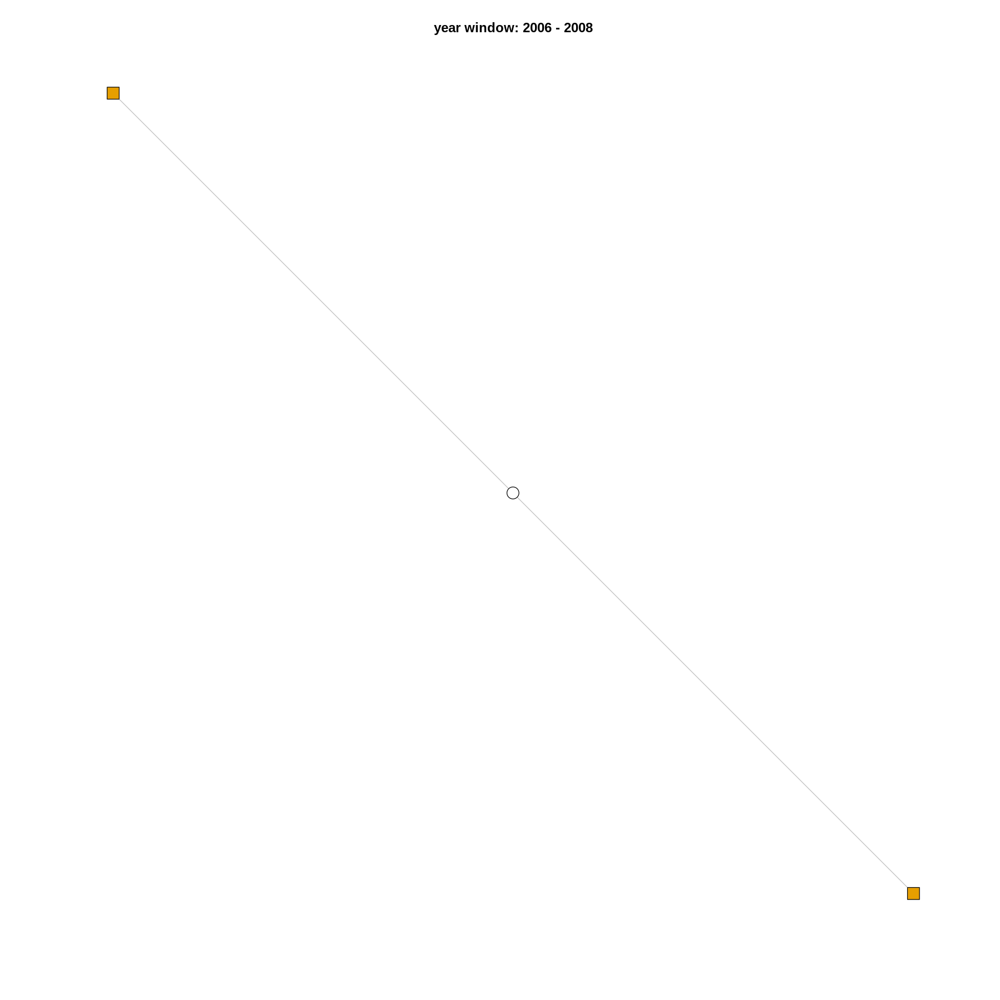

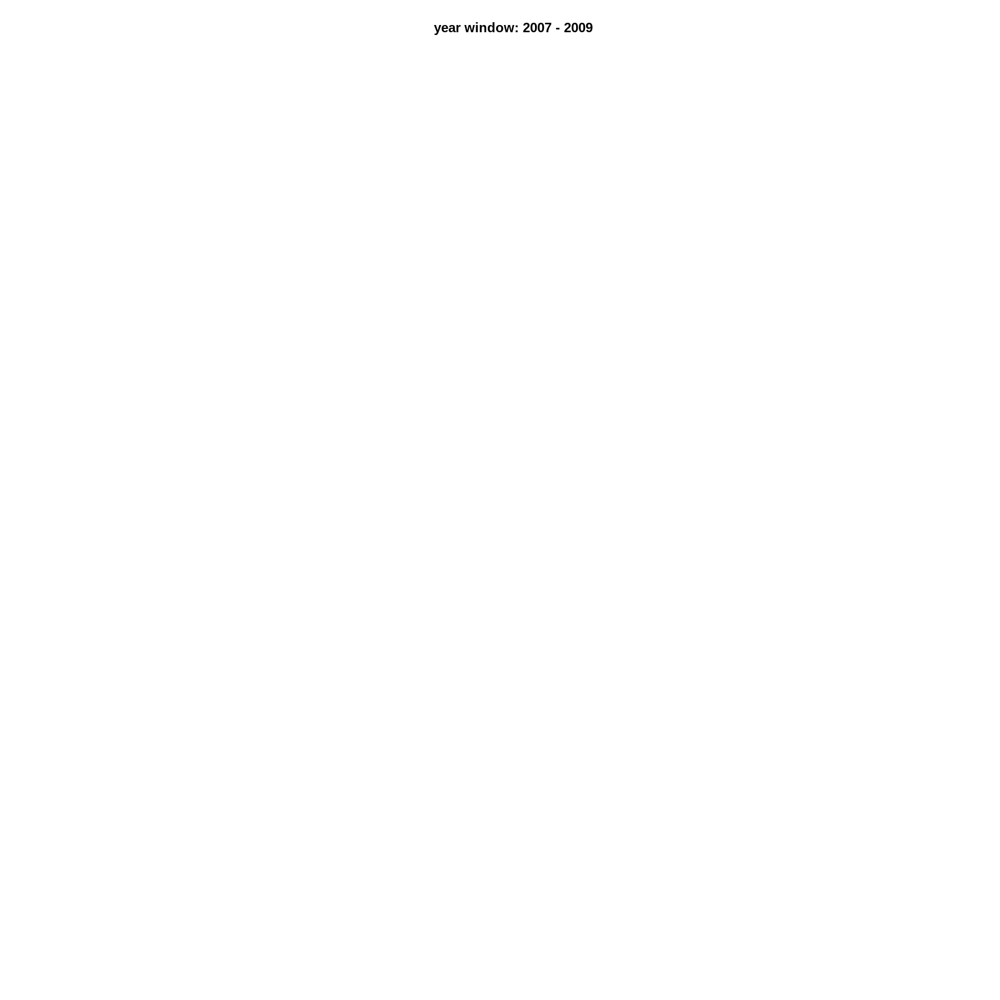

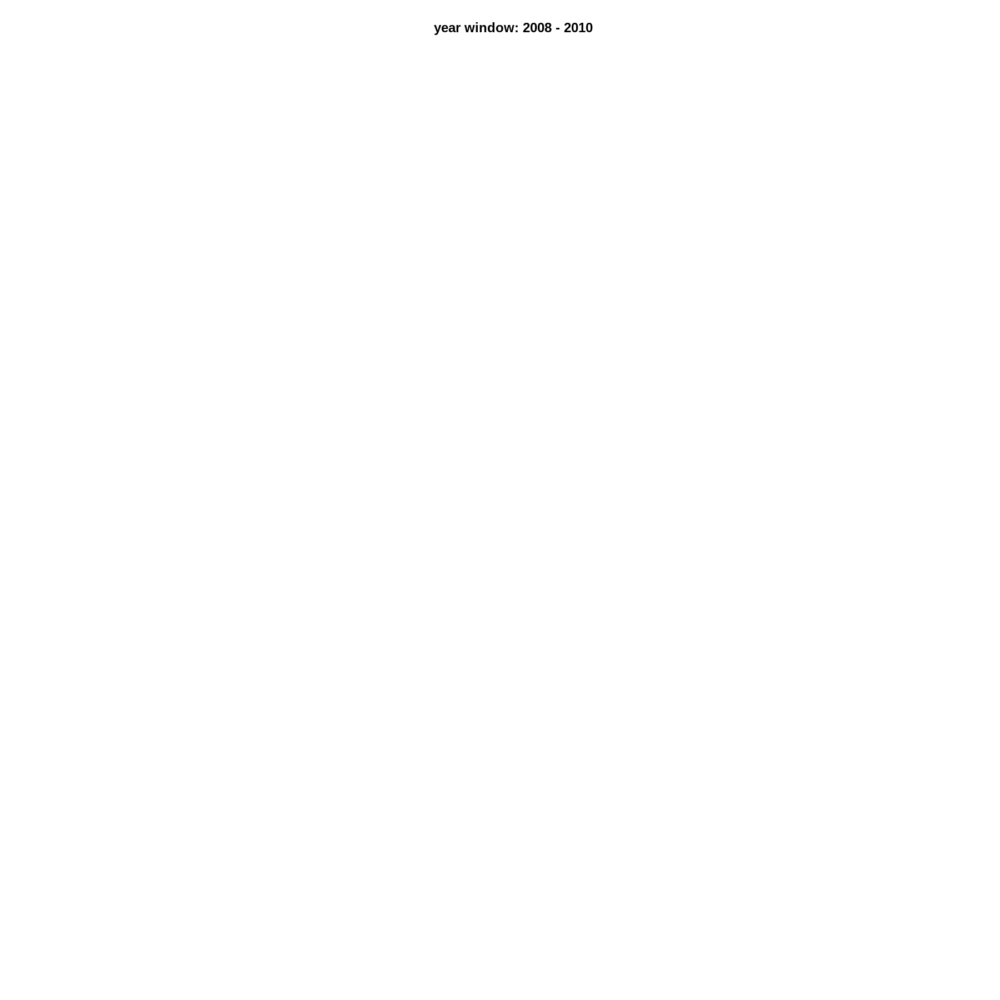

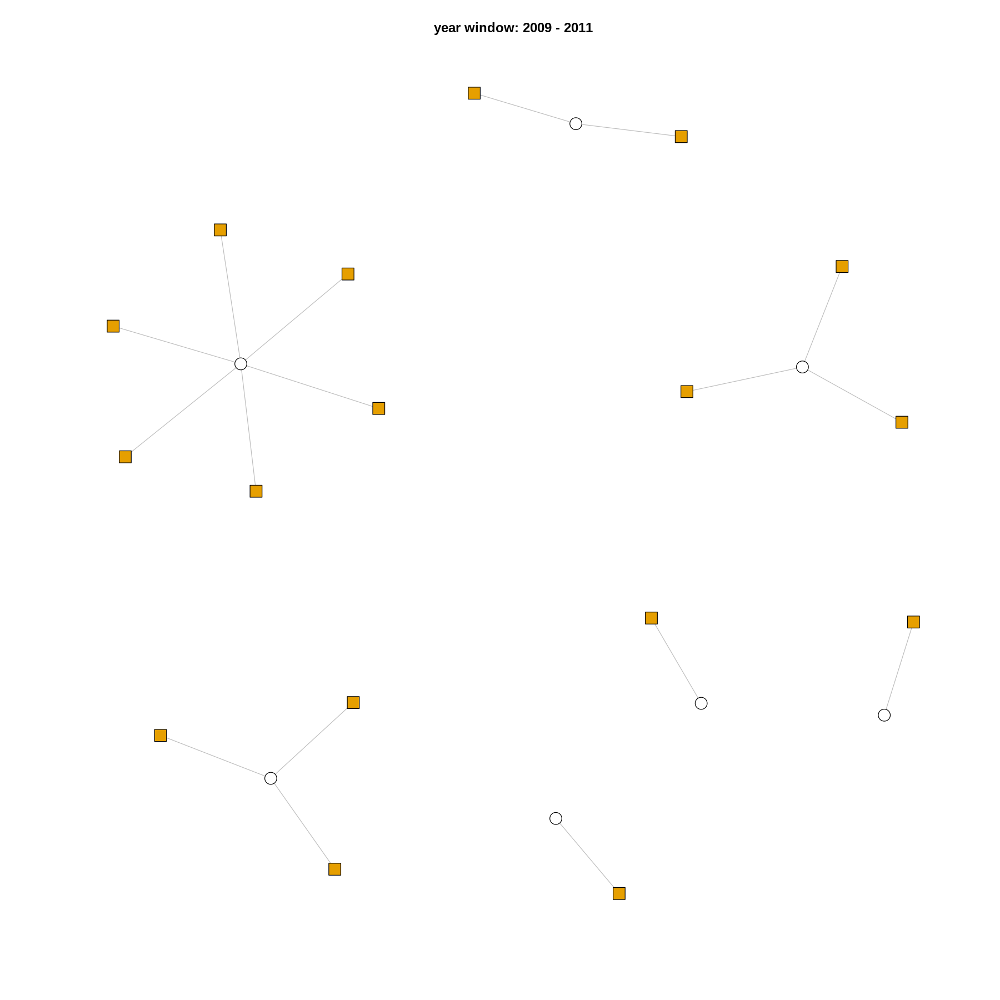

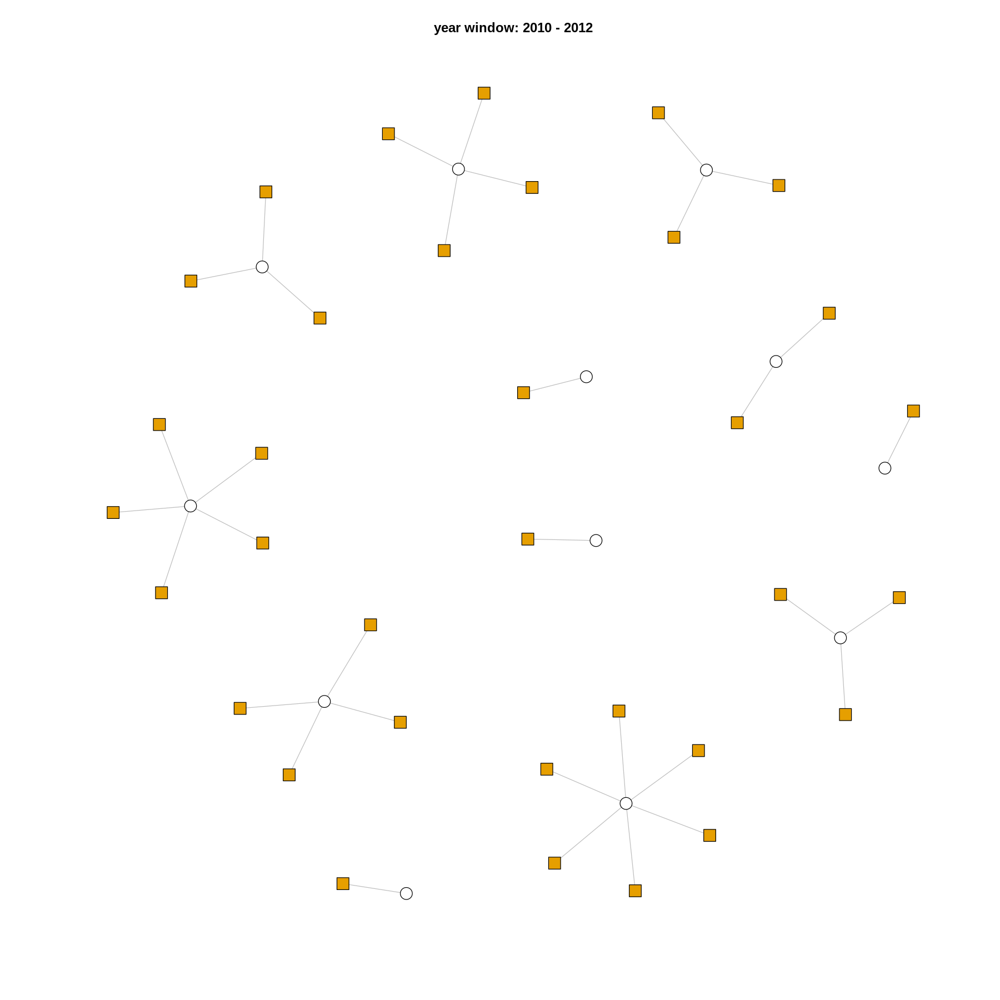

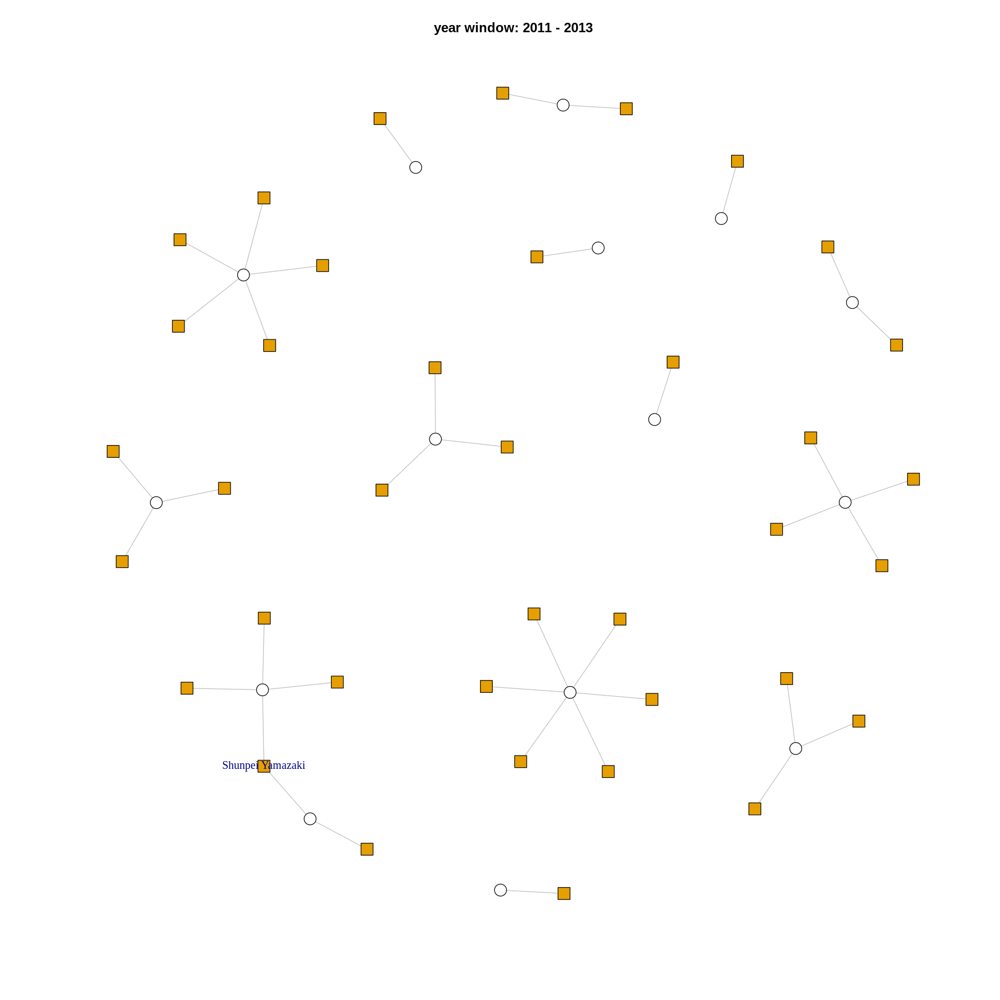

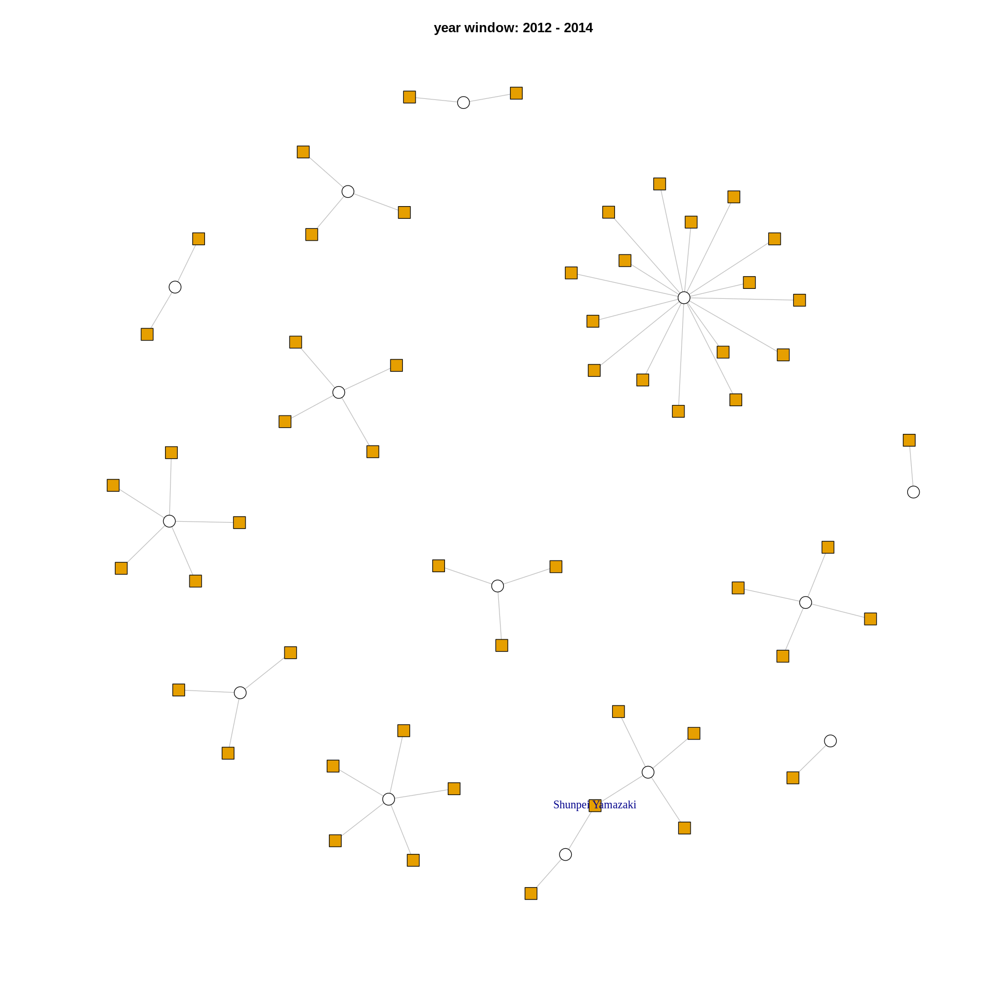

In [ ]:
window_width = 3
end = 2023 - window_width + 1
degree_threshold = 1
for (start_year in 2006:end) {
  edgelist <- window_patent_inventor_edgelist(window_width, start_year)
  graph <- bipartite_graph(edgelist)
  plotting_key_inventors(graph, degree_threshold)
}


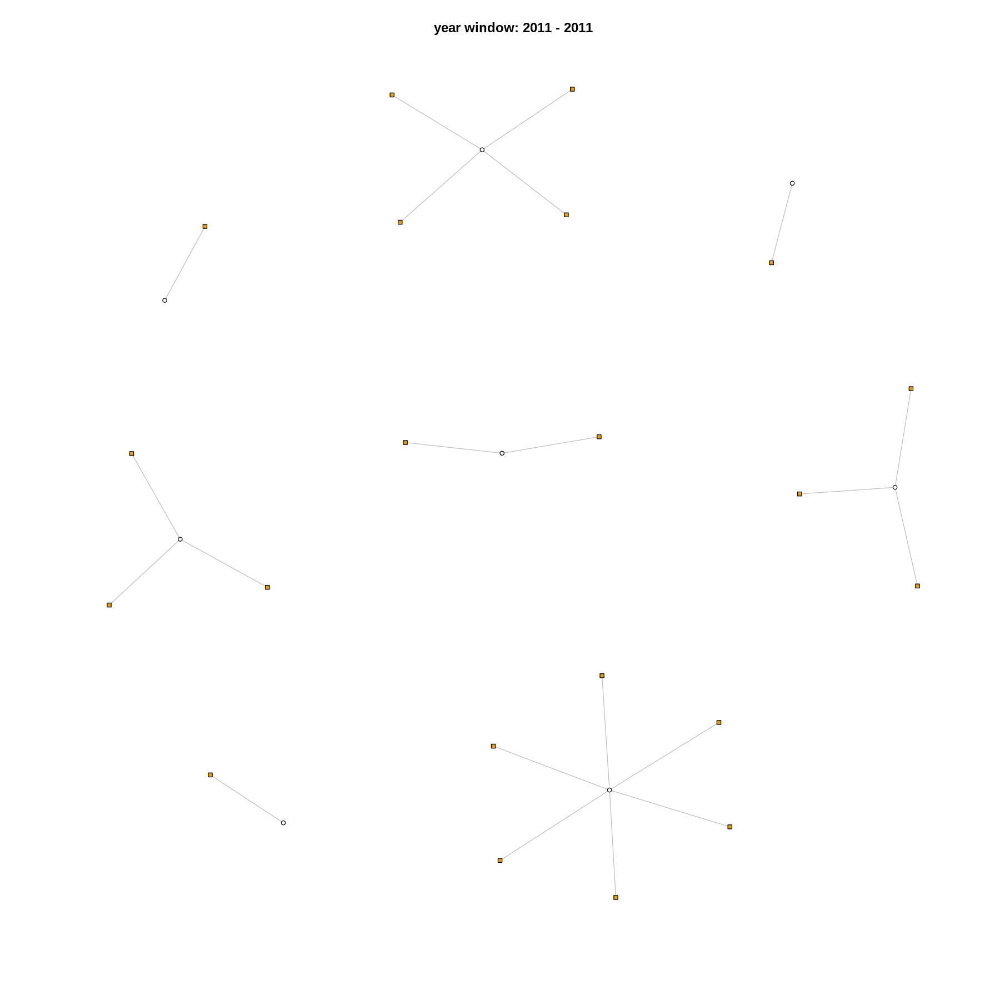

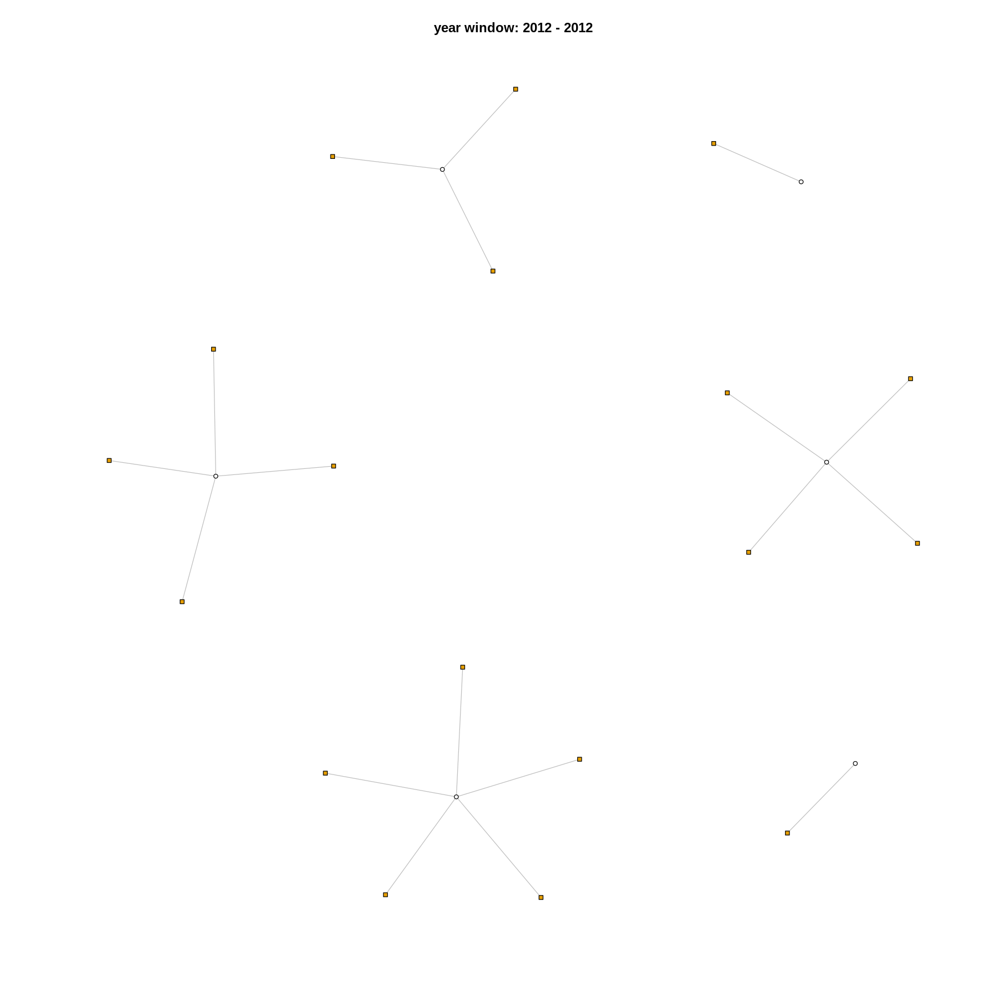

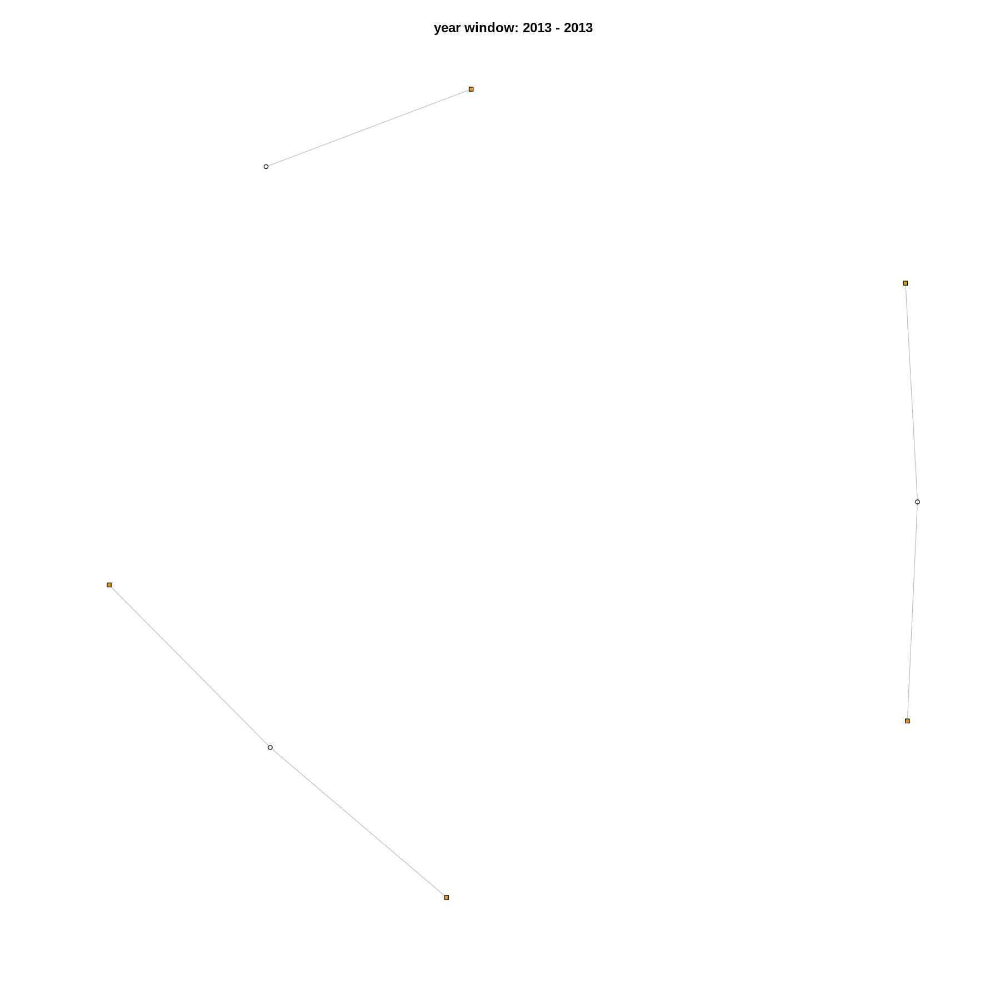

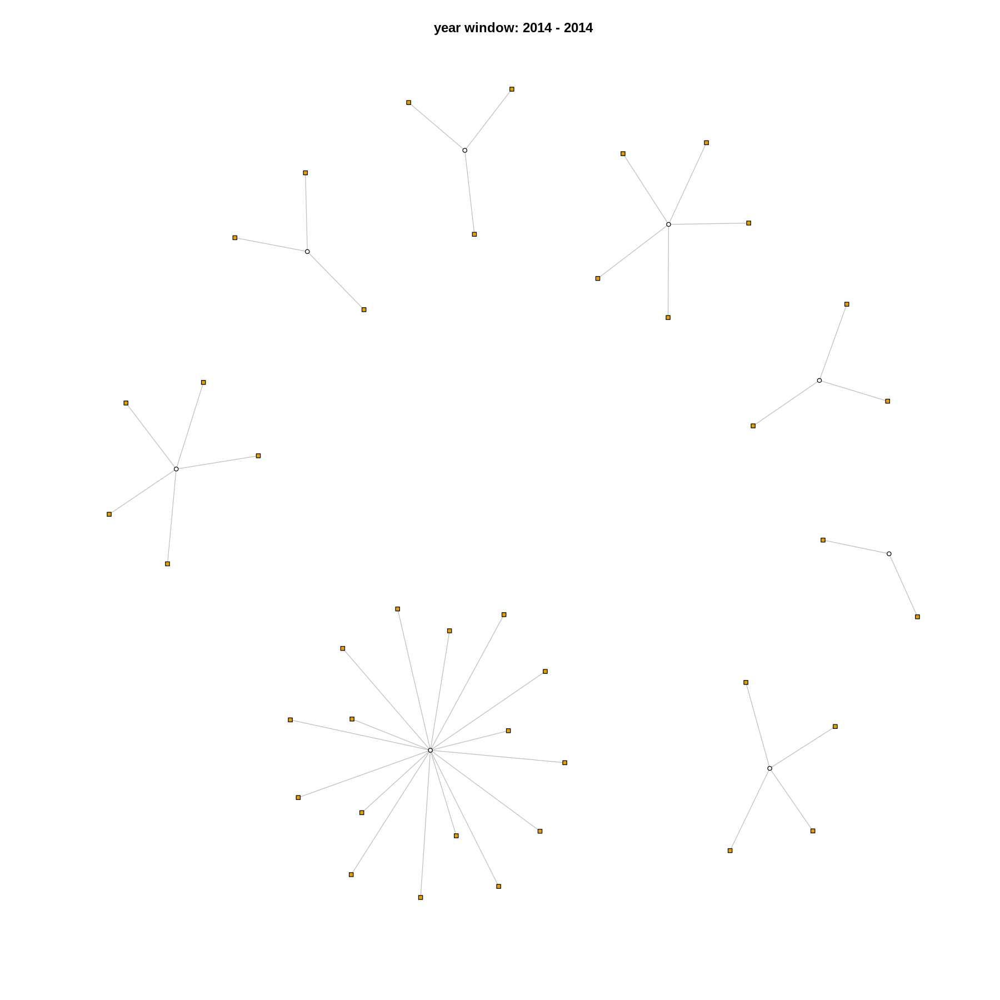

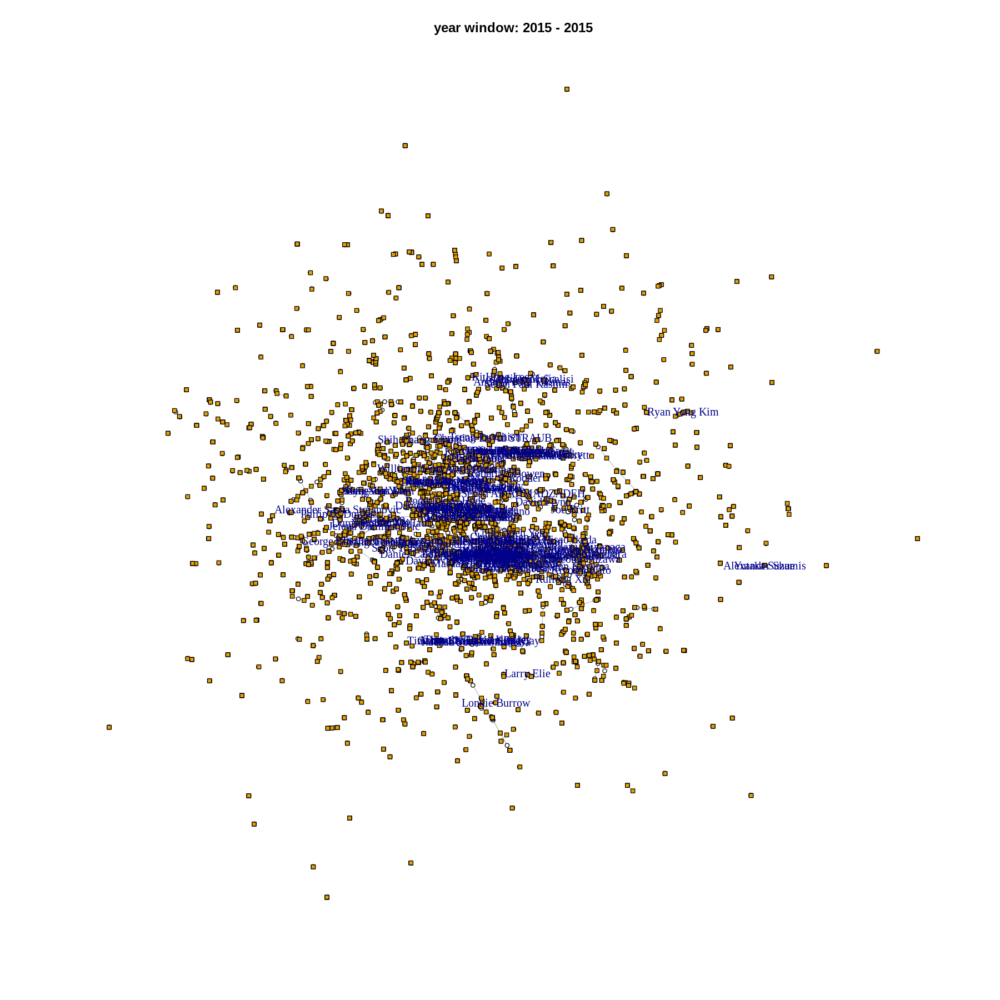

...

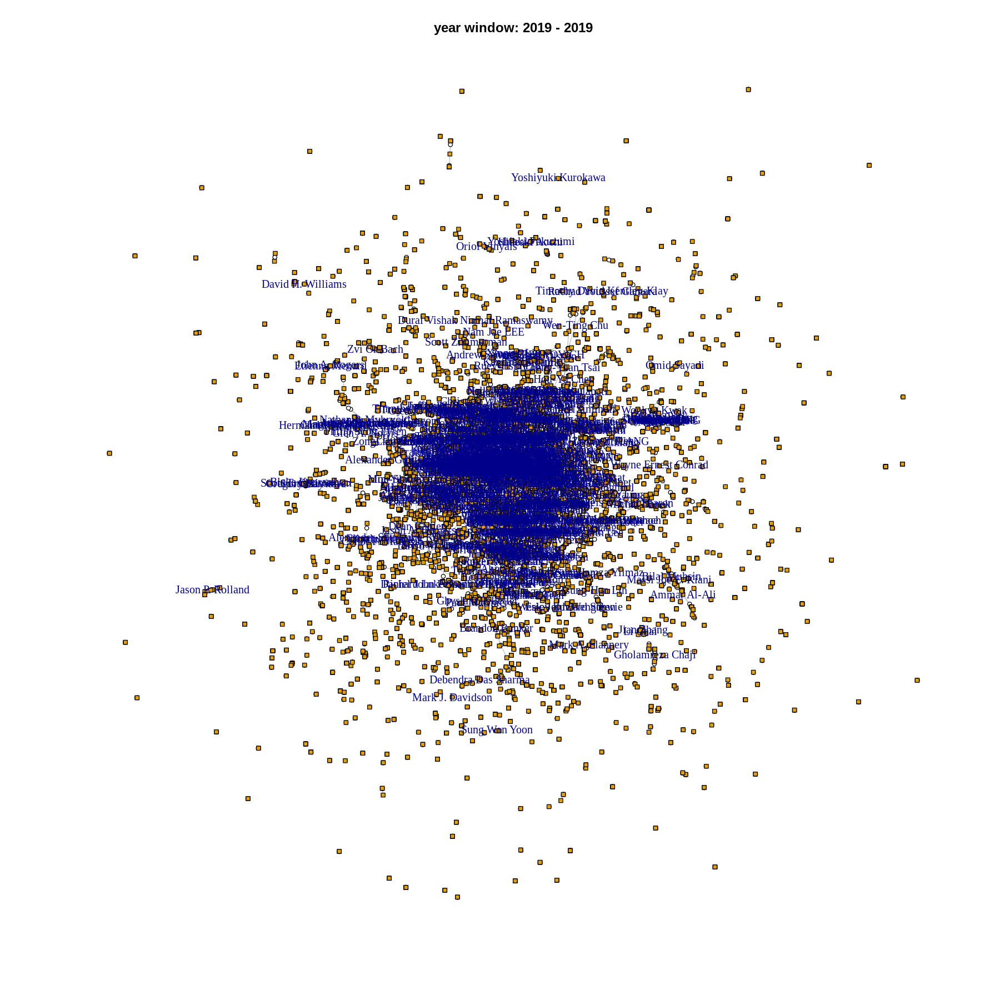

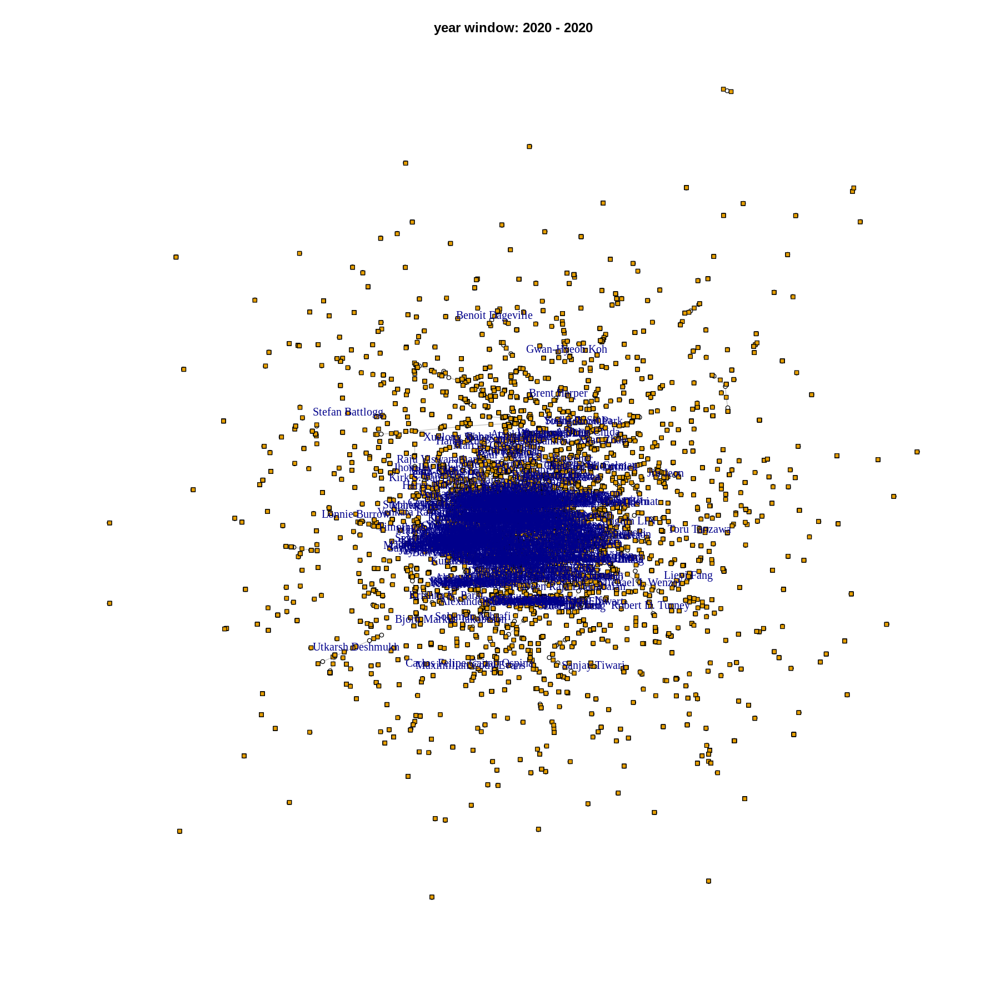

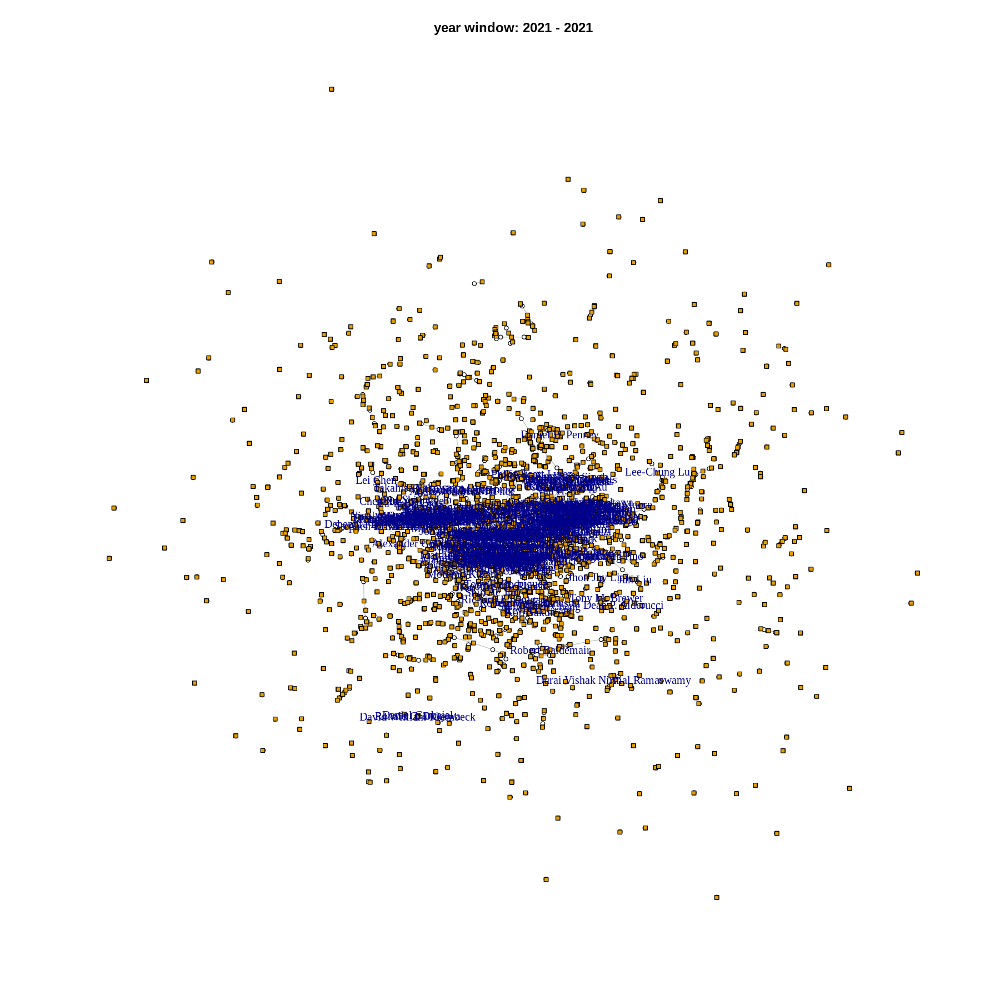

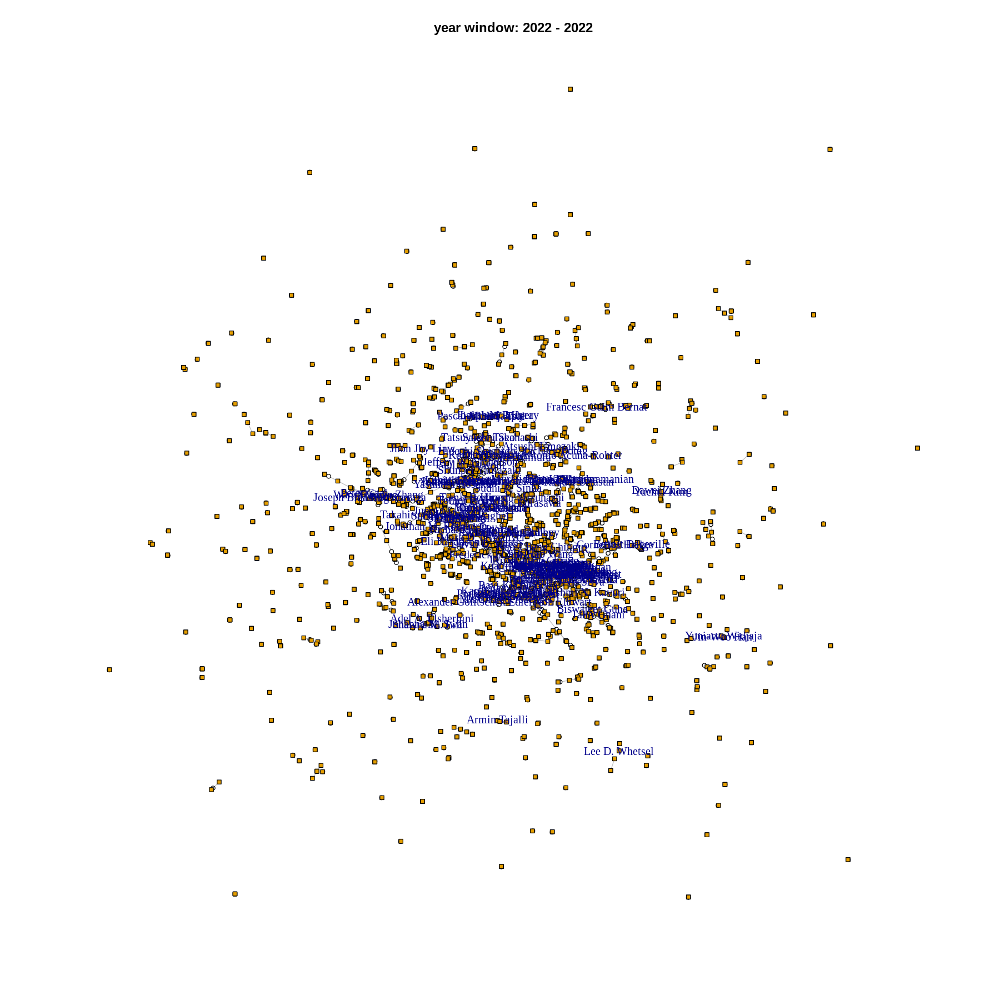

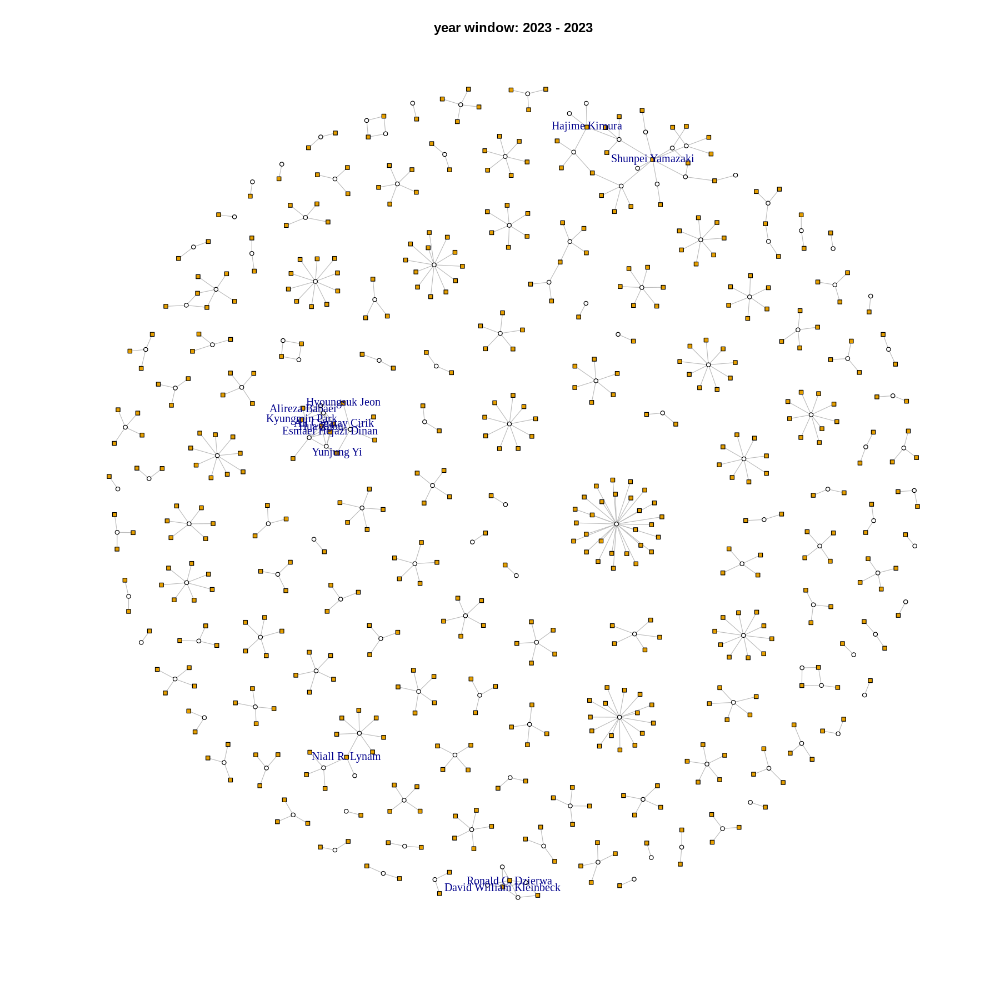

In [ ]:
window_width = 1
end = 2023 - window_width + 1
degree_threshold = 2
for (start_year in 2011:end) {
  edgelist <- window_patent_inventor_edgelist(window_width, start_year)
  graph <- bipartite_graph(edgelist)
  plotting_key_inventors(graph, degree_threshold)
}

# 整體網絡結構分析：分析指標與次數分布雙對數圖

In [ ]:
year <- 2015
df_metrics <- window_patent_inventor_edgelist(1,year) %>% bipartite_graph() %>% analytics_metrics()
colnames(df_metrics) <- c("metrics", year)

for(year in c(2016:2023)){
  df_metrics_year <- window_patent_inventor_edgelist(1,year) %>% bipartite_graph() %>% analytics_metrics()
  colnames(df_metrics_year) <- c("metrics", year)
  df_metrics <- cbind(df_metrics, df_metrics_year[2])
}


In [ ]:
round_df <- function(x, digits) {
    # round all numeric variables
    # x: data frame
    # digits: number of digits to round
    numeric_columns <- sapply(x, mode) == 'numeric'
    x[numeric_columns] <-  round(x[numeric_columns], digits)
    x
}

In [ ]:
round_df(df_metrics, 3)

metrics,2015,2016,2017,2018,2019,2020,2021,2022,2023
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Number of patents,1564.000,3661.000,4307.000,4198.000,3733.000,2928.000,1782.000,1002.000,157.000
Number of inventors,4670.000,9676.000,11714.000,11499.000,10590.000,8787.000,5486.000,3071.000,515.000
Alpha (patent degree distribution),1.657,1.669,1.645,1.635,1.625,1.616,1.618,1.619,1.656
Alpha (inventor degree distribution),3.512,3.154,3.117,3.101,3.147,3.217,3.309,3.434,4.256
Number of components,1115.000,2281.000,2580.000,2522.000,2254.000,1812.000,1133.000,673.000,131.000
Alpha (component size distribution),2.007,2.021,1.982,1.994,1.964,1.937,1.933,1.943,1.999
Number of patents in largest component,98.000,234.000,345.000,314.000,305.000,116.000,82.000,59.000,12.000
Number of inventors in largest component,149.000,684.000,821.000,502.000,517.000,451.000,322.000,89.000,19.000
Proportion of patents in largest component,0.063,0.064,0.080,0.075,0.082,0.040,0.046,0.059,0.076


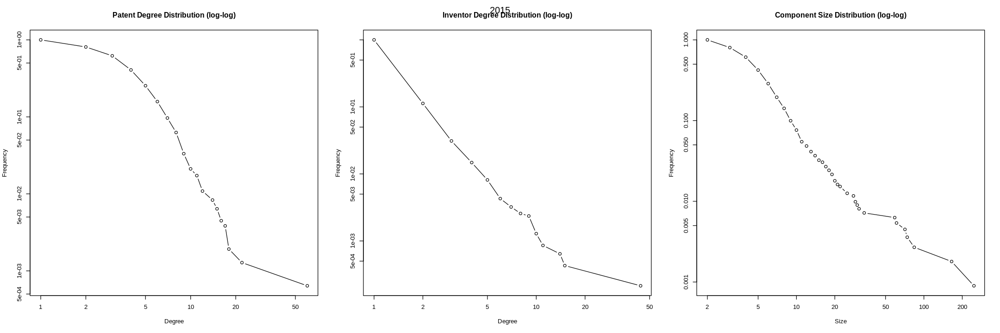

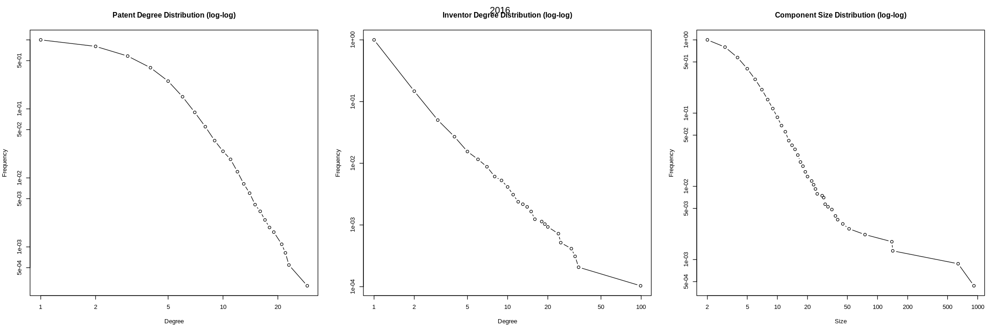

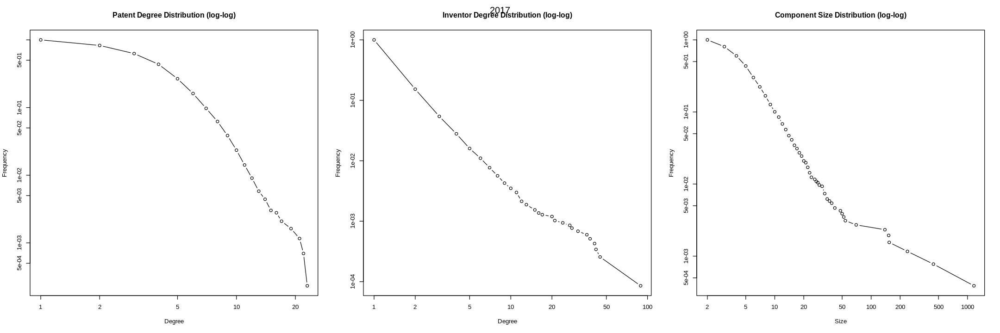

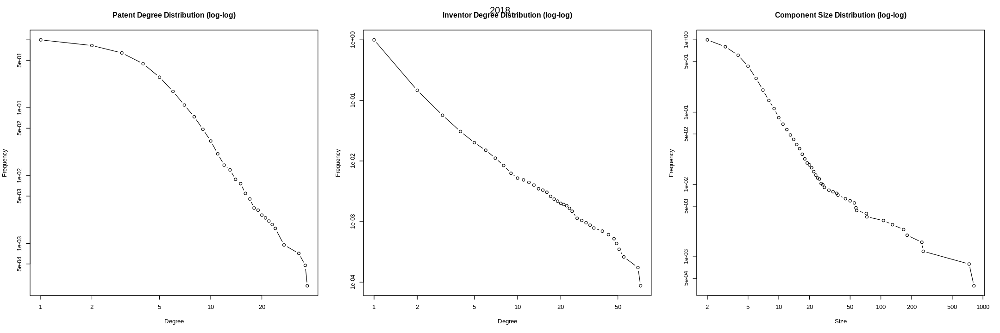

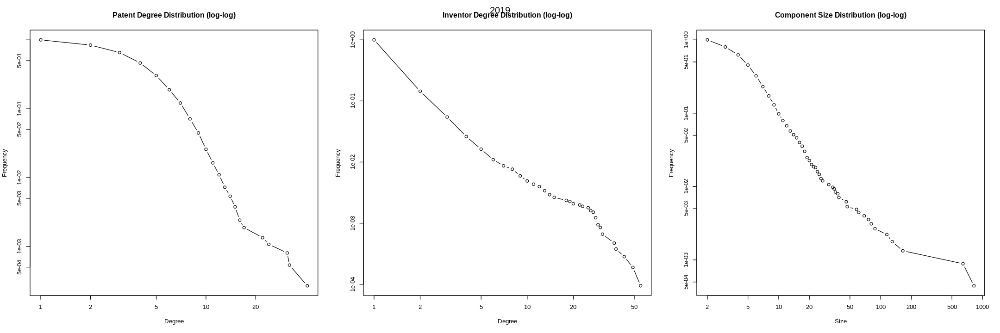

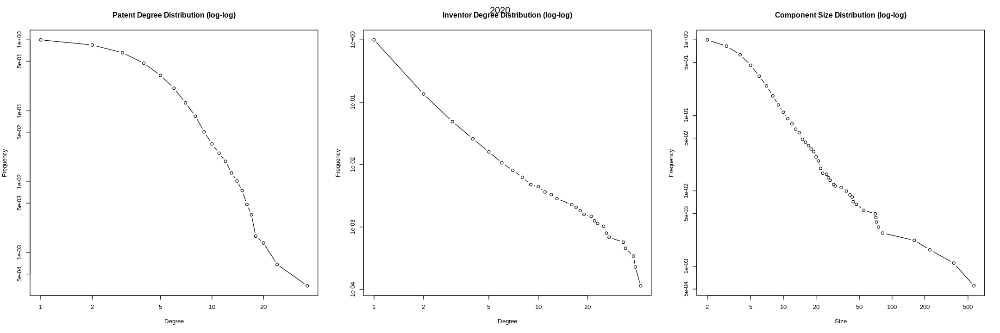

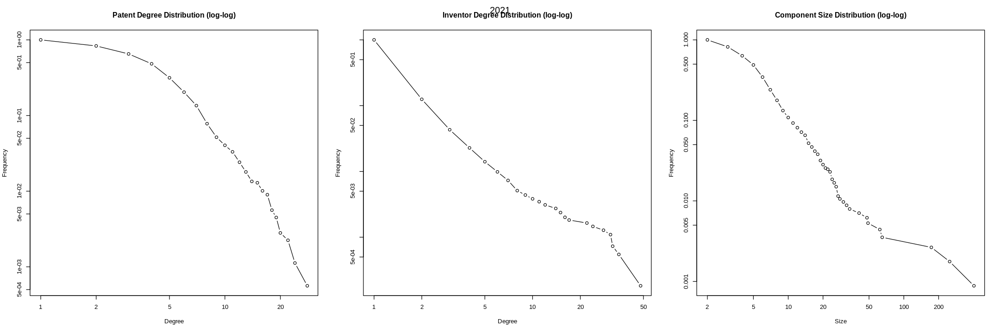

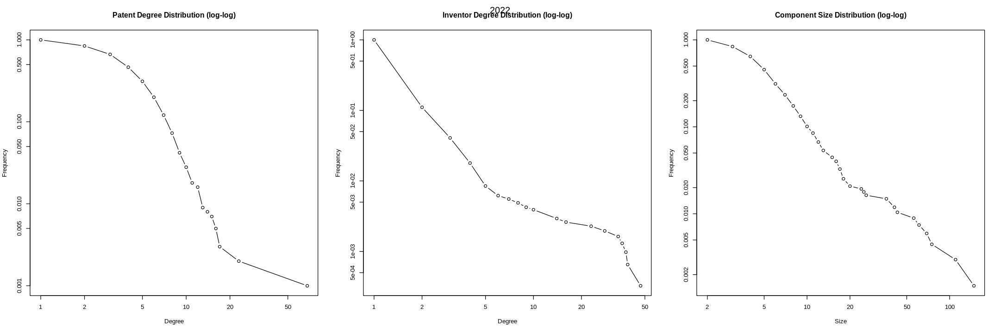

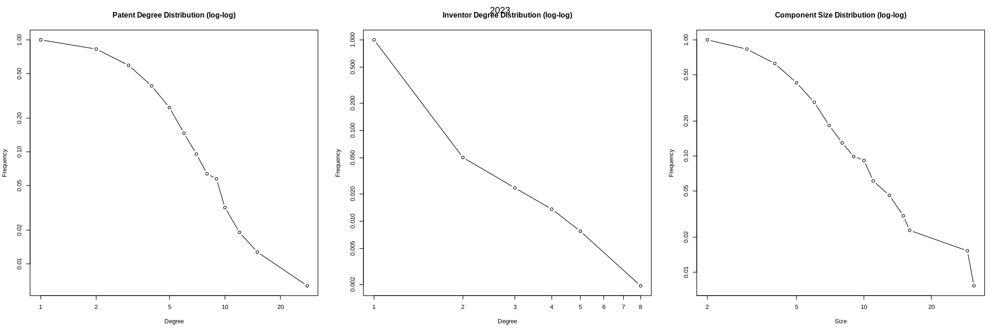

In [ ]:
for(year in c(2015:2023)){
  g <- window_patent_inventor_edgelist(1,year) %>% bipartite_graph()
  loglogplots(g, year)
}

# 年度時間窗格網絡圖演變：最大組成部分

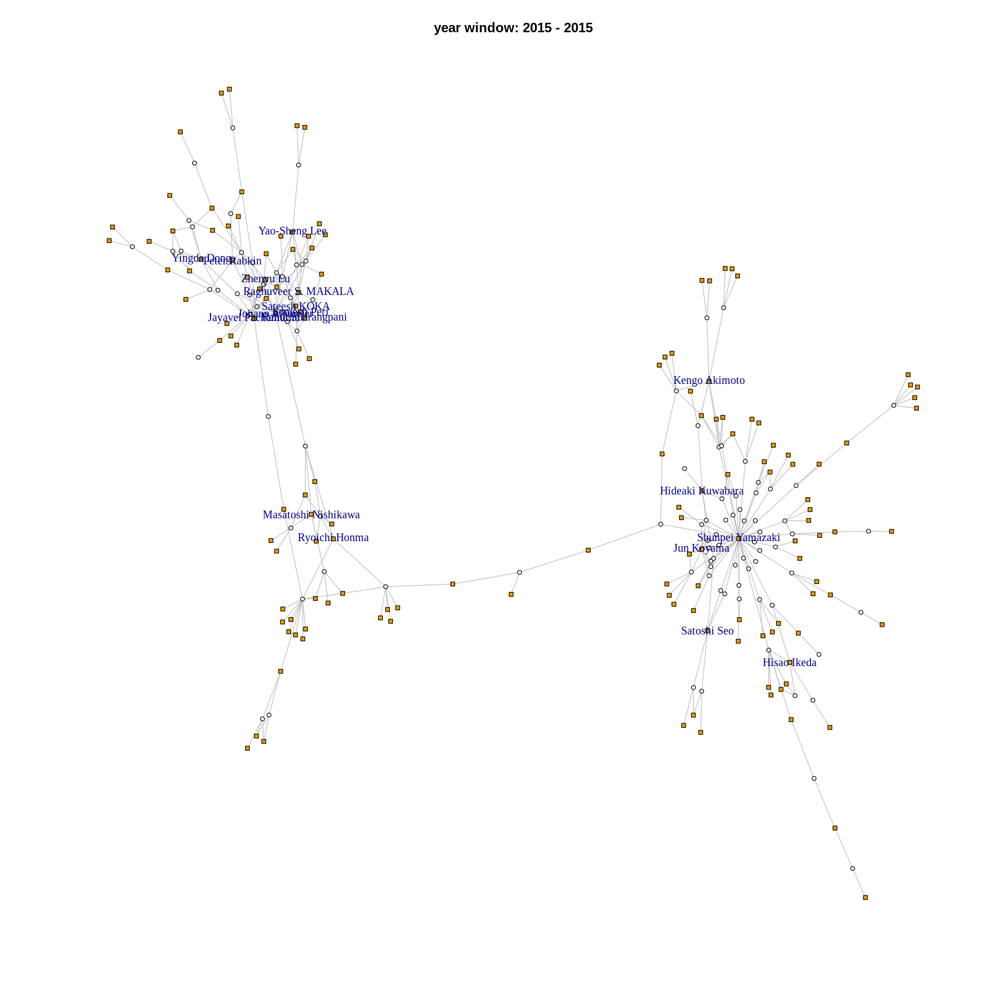

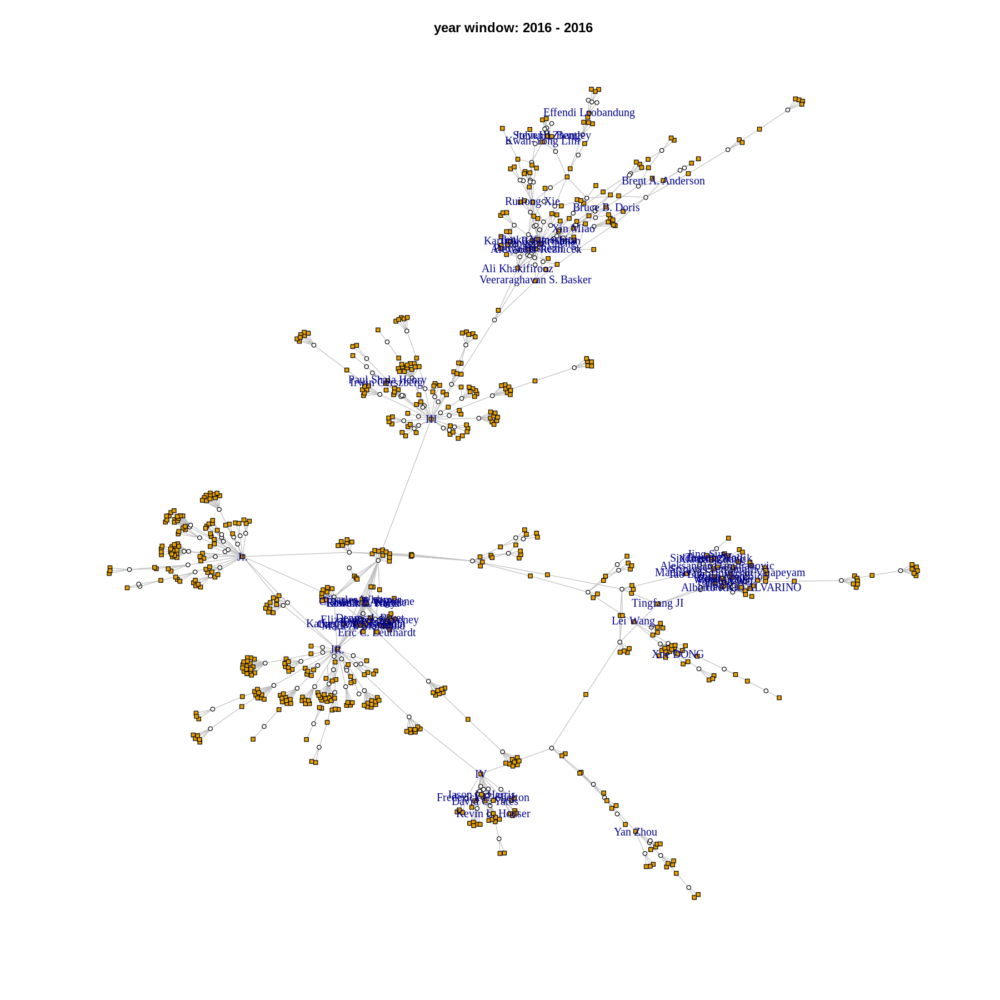

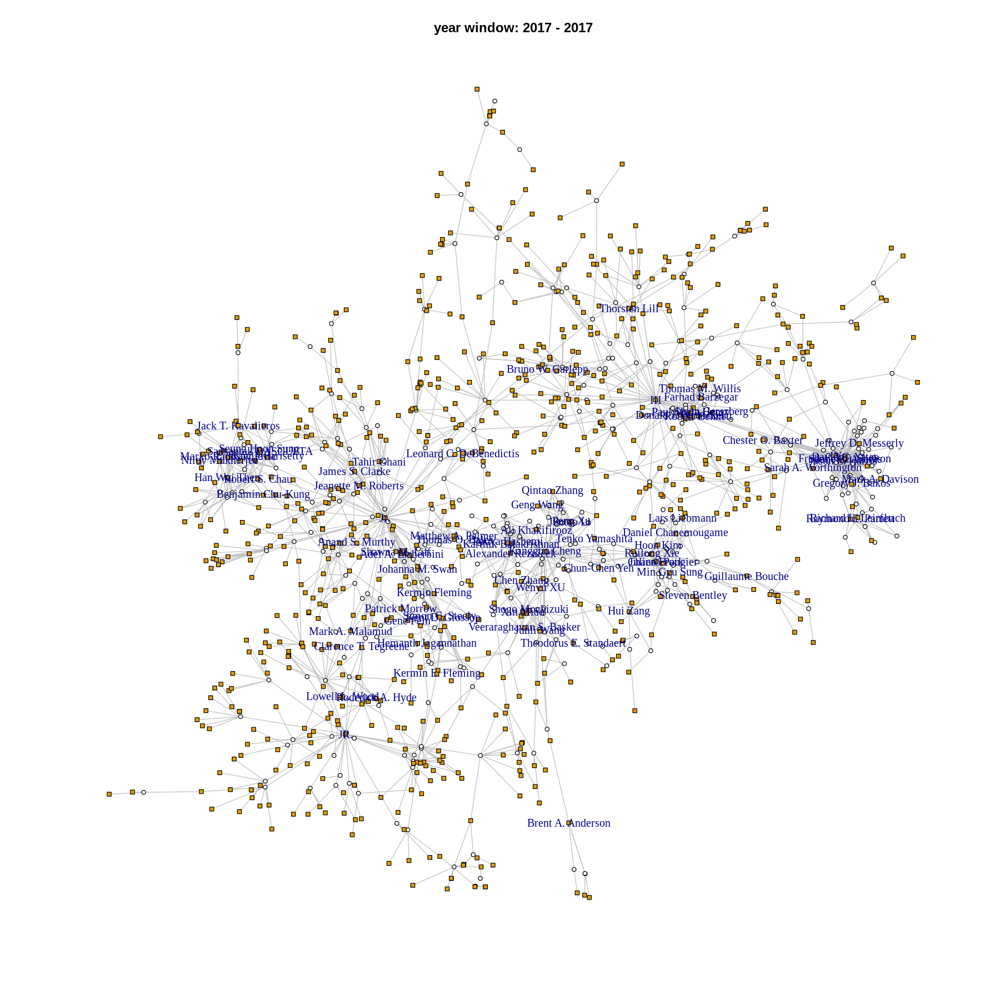

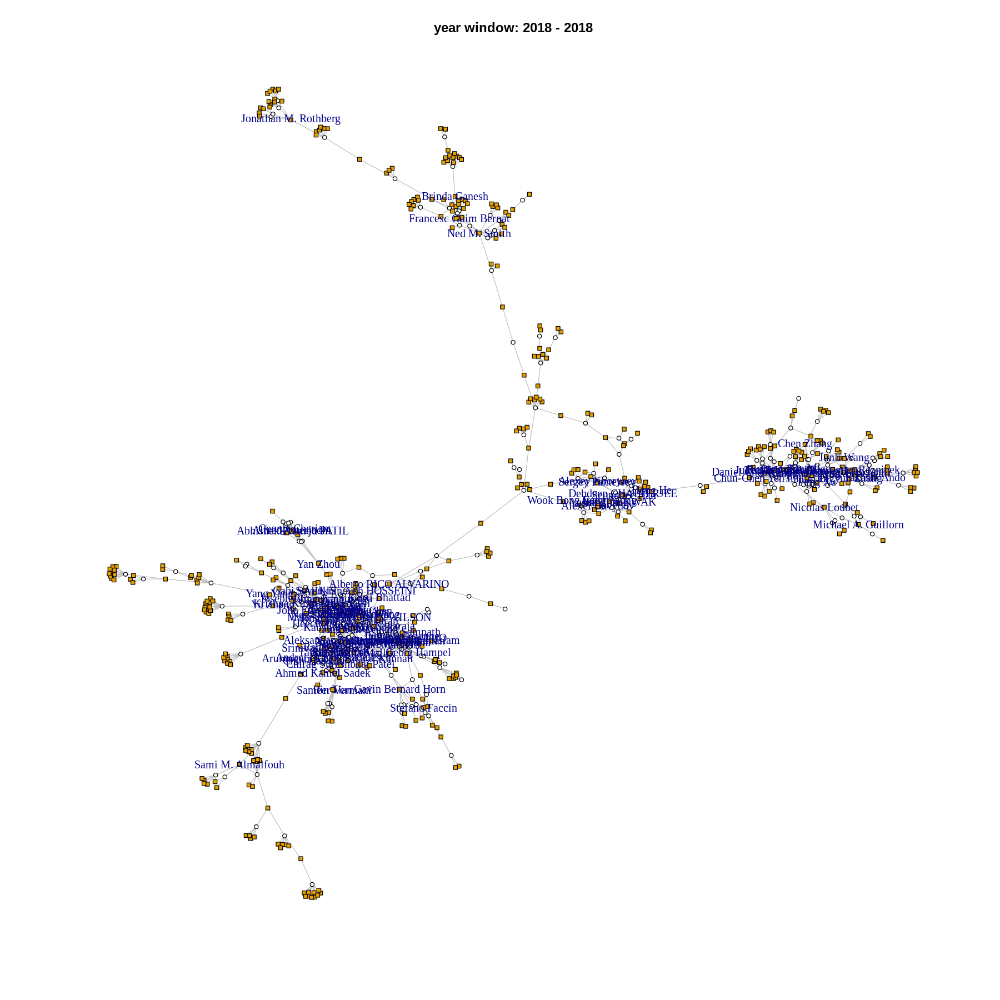

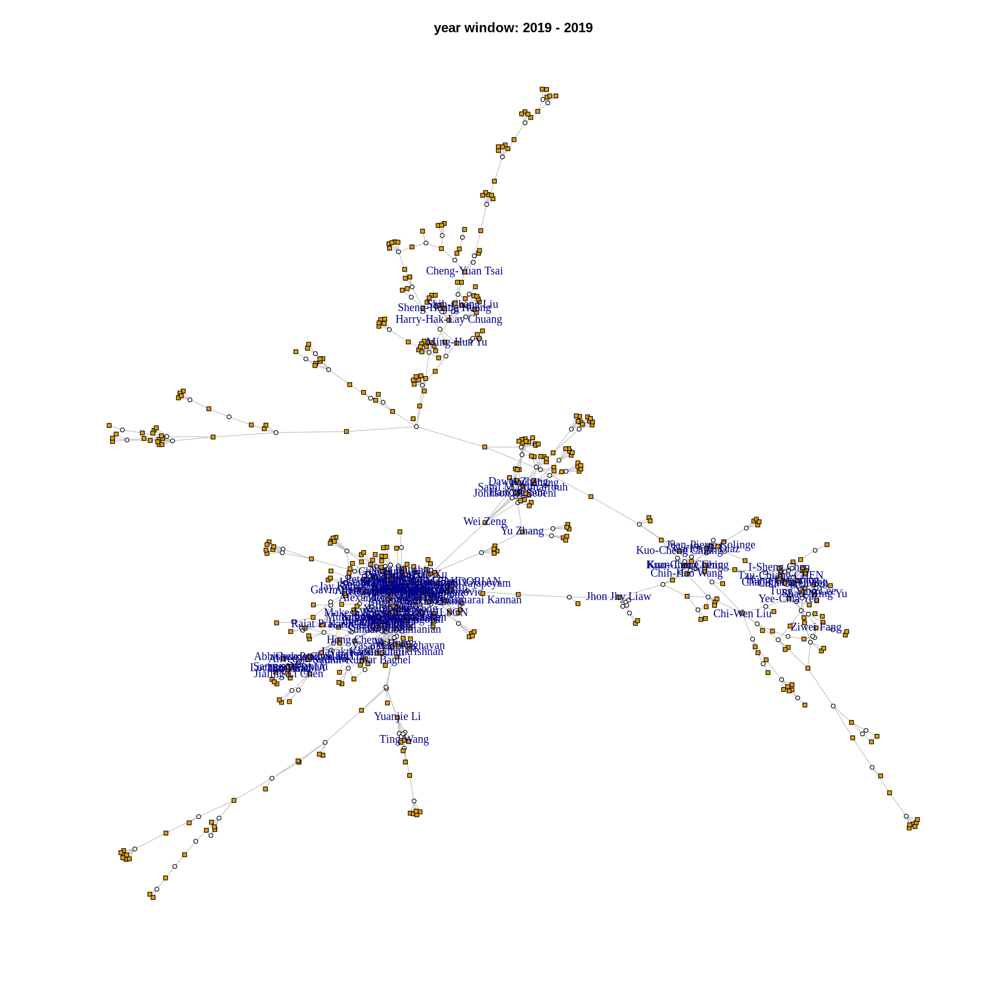

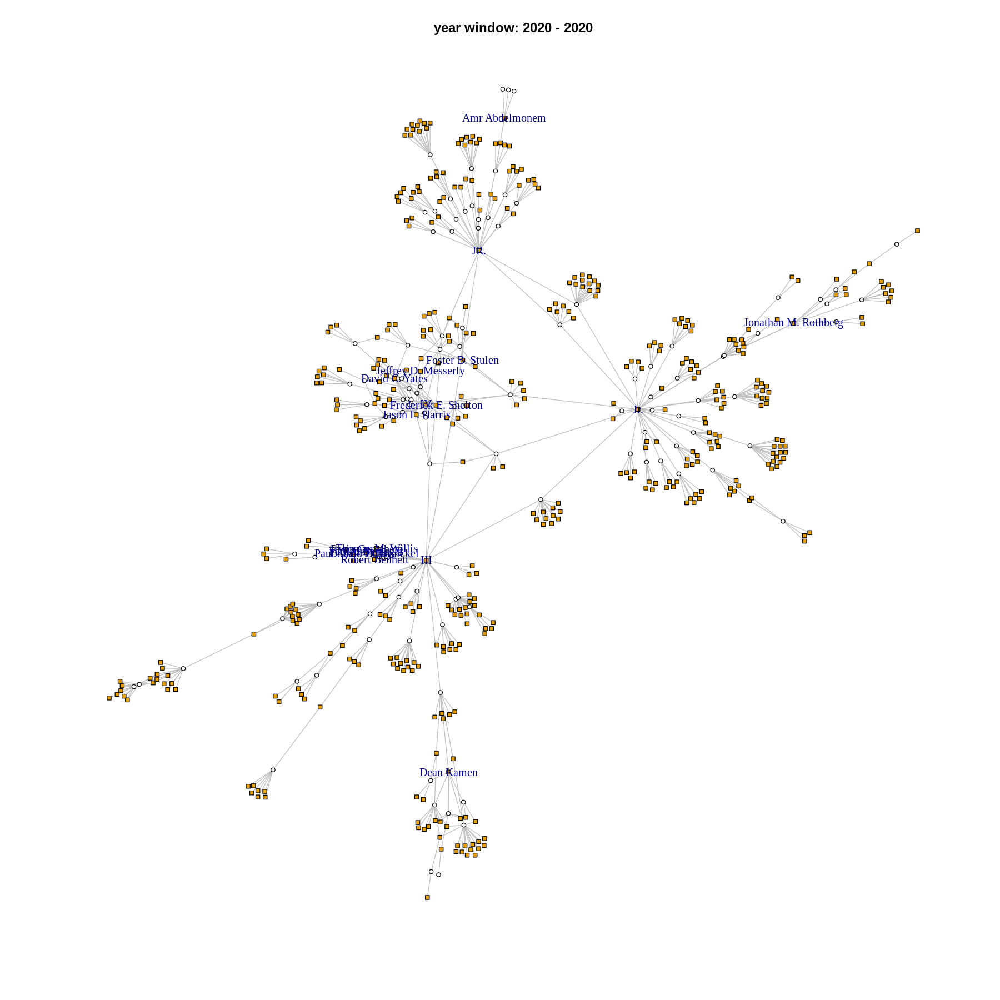

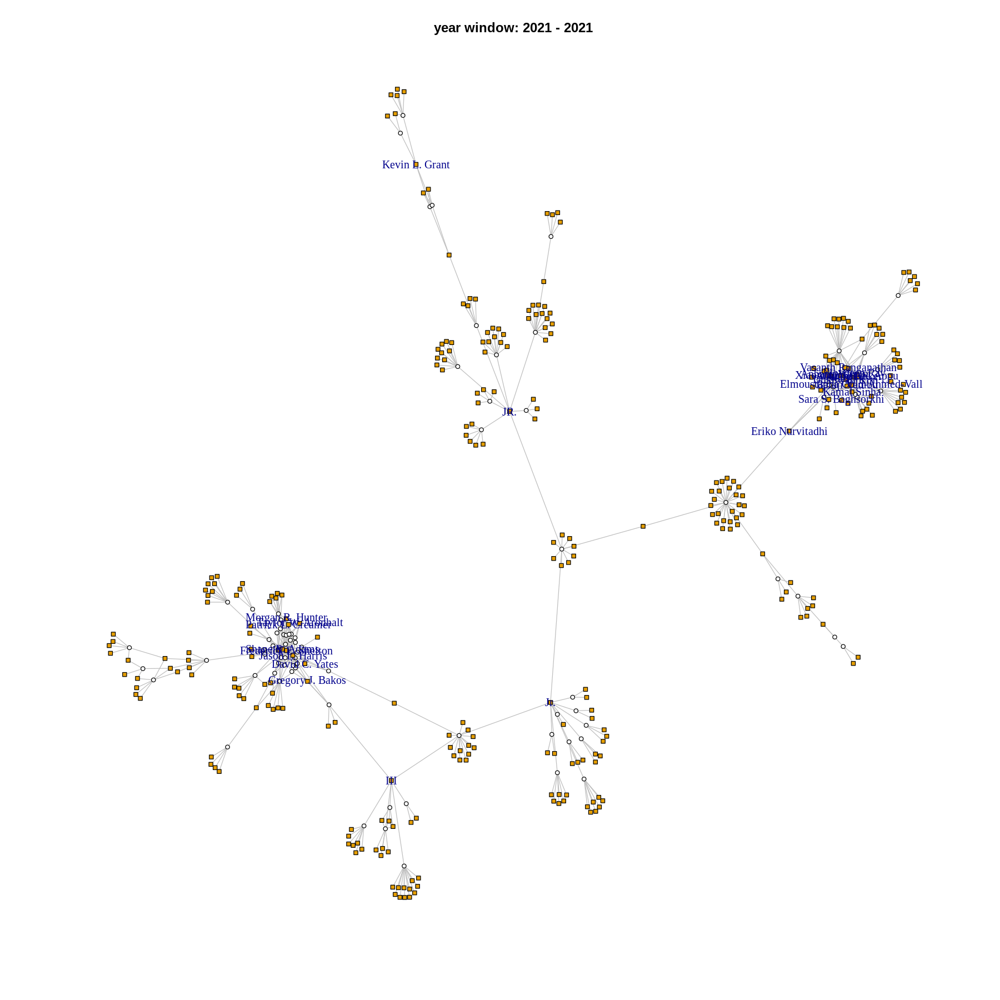

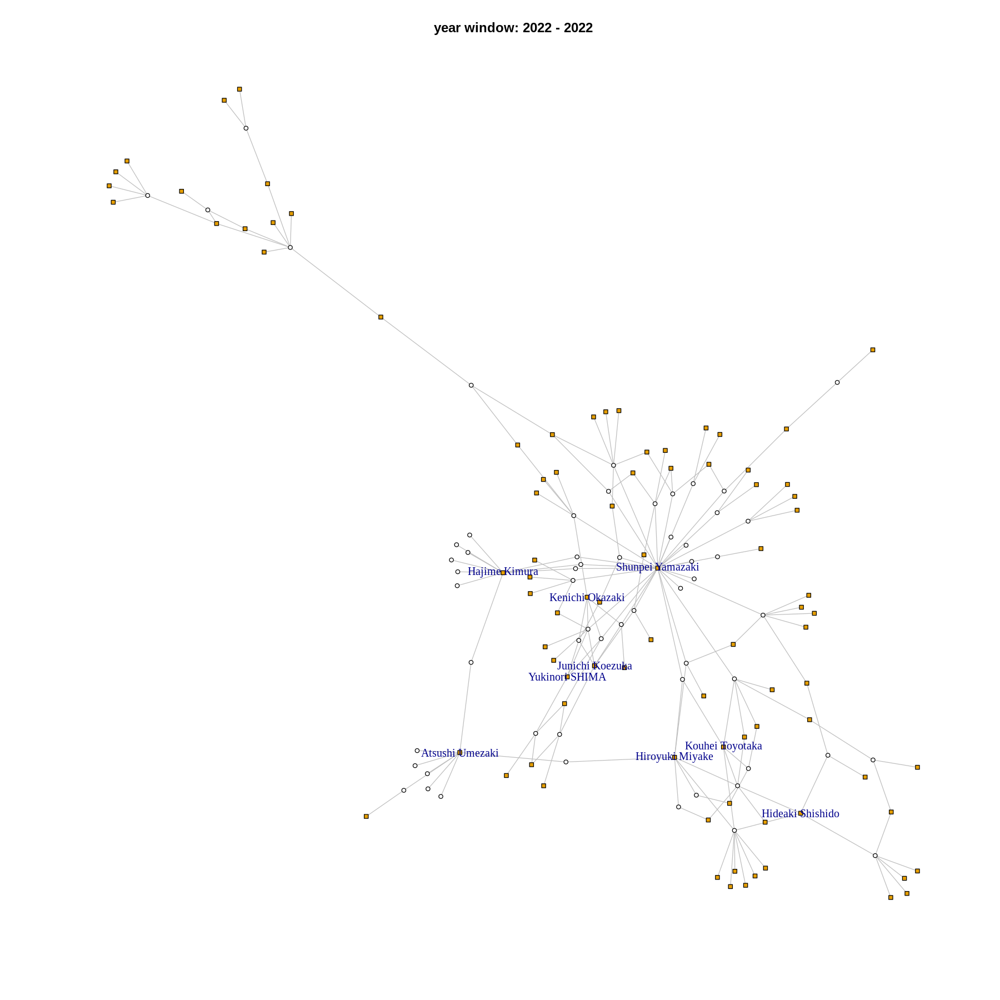

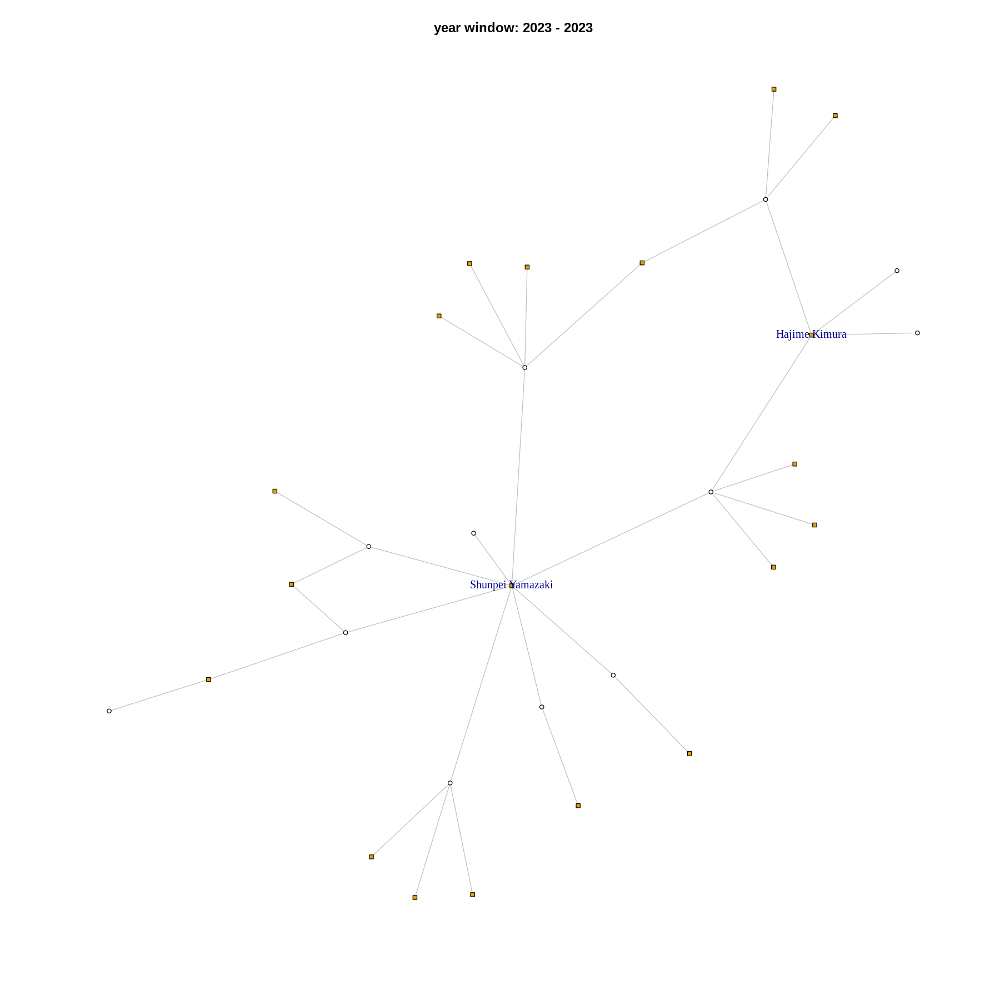

In [ ]:
window_width = 1
end = 2023 - window_width + 1
degree_threshold = 3

for (start_year in 2015:end) {
  edgelist <- window_patent_inventor_edgelist(window_width, start_year)
  graph <- bipartite_graph(edgelist)

  # Extract largest component
  components <- components(graph)
  largest_component <- induced_subgraph(graph, which(components$membership == which.max(components$csize)))

  plotting_key_inventors(largest_component, degree_threshold)
}

# 各年度的關鍵發明人：依據連結度(degree)與中間中心性(betweenness)

定義一個函數以產生關鍵發明人列表。此函數具焦於最大組成部分，以連結度(degree)作為發明人間比較指標。輸入包括時間窗格長度、起始年、篩選名次，輸出為發明人名稱與連結度列表。

例如：key_inventors_degree(1, 2015, 5)會產生2015年專利資料所產生的網絡之最大組成部分中連結度最高的前五名發明人列表。

In [ ]:
key_inventors_degree <- function(window_width, start_year, top){
  # Extract largest component
  edgelist <- window_patent_inventor_edgelist(window_width, start_year)
  graph <- bipartite_graph(edgelist)
  components <- components(graph)
  largest_component <- induced_subgraph(graph, which(components$membership == which.max(components$csize)))

  # Calculate degree centrality for inventors in the largest component
  inventor_nodes <- V(largest_component)[V(largest_component)$type == TRUE]
  inventor_degrees <- degree(largest_component, v = inventor_nodes)

  # Create dataframes for top ? inventors by degree centrality
  top_10_degree <- data.frame(
    Inventor = inventor_nodes$name,
    Degree = inventor_degrees
  ) %>%
    arrange(desc(Degree)) %>%
    head(top) %>%
    mutate(Label = paste(Inventor, "(", Degree, ")", sep = "")) %>%
    select(Label)

  rownames(top_10_degree) <- c(1:10)
  colnames(top_10_degree) <- start_year

  # Print the dataframes
  return(top_10_degree)
}

In [ ]:
top10_inventors_degree <- key_inventors_degree(1, 2015, 10)
for(year in c(2016:2023)){
  top10_inventors_degree <- cbind(top10_inventors_degree, key_inventors_degree(1,year,10))
}
top10_inventors_degree

,2015,2016,2017,2018,2019,2020,2021,2022,2023
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,Shunpei Yamazaki(44),JR.(34),Kangguo Cheng(45),Tao Luo(43),Tao Luo(55),Jr.(26),IV(35),Shunpei Yamazaki(28),Shunpei Yamazaki(8)
2,Johann Alsmeier(14),Kangguo Cheng(32),IV(45),Tamer Kadous(39),Wanshi Chen(38),III(25),Frederick E. Shelton(31),Hajime Kimura(10),Hajime Kimura(4)
3,Jayavel Pachamuthu(10),III(25),Frederick E. Shelton(42),Wanshi Chen(32),Peter Gaal(31),JR.(21),Jason L. Harris(22),Atsushi Umezaki(8),Hiroyuki Miyake(2)
4,Jun Koyama(10),Jr.(24),III(41),Peter Gaal(30),Junyi Li(30),IV(18),Jr.(11),Hiroyuki Miyake(7),Masashi TSUBUKU(2)
5,Raghuveer S. MAKALA(9),Wanshi Chen(15),Jr.(38),Kangguo Cheng(28),Xiaoxia Zhang(27),Frederick E. Shelton(16),Shane R. Adams(11),Kouhei Toyotaka(5),Jun Koyama(2)
6,Kengo Akimoto(6),Alexander Reznicek(14),Jason L. Harris(36),Jing Sun(23),Jing Sun(26),Jason L. Harris(10),JR.(8),Junichi Koezuka(5),Junichi Koezuka(1)
7,Sateesh KOKA(6),IV(14),David C. Yates(31),Junyi Li(23),Srinivas Yerramalli(22),David C. Yates(9),Altug Koker(8),Kenichi Okazaki(5),Masami Jintyou(1)
8,Yingda Dong(6),Peter Gaal(13),Ruilong Xie(28),Ruilong Xie(22),Muhammad Nazmul Islam(20),Paul Shala Henry(8),Patrick L. Creamer(8),Hideaki Shishido(4),Yukinori SHIMA(1)
9,Zhenyu Lu(5),Ruilong Xie(11),JR.(27),Srinivas Yerramalli(22),Aleksandar Damnjanovic(19),Jonathan M. Rothberg(7),Abhishek R. Appu(7),Yukinori SHIMA(4),Kengo Akimoto(1)


定義一個函數以產生關鍵發明人列表。作法皆與上面一樣，只是將比較指標換成中間中心性(betweenness)。有些發明人的重要性並不再於參與非常多專利的發明，而是在於將不同的專利發明群落連結在一起，這種橋樑作用可以利用betweenness來測量。

In [ ]:
key_inventors_betweenness <- function(window_width, start_year, top){
  # Extract largest component
  edgelist <- window_patent_inventor_edgelist(window_width, start_year)
  graph <- bipartite_graph(edgelist)
  components <- components(graph)
  largest_component <- induced_subgraph(graph, which(components$membership == which.max(components$csize)))

  # Calculate betweenness centrality for inventors in the largest component
  inventor_nodes <- V(largest_component)[V(largest_component)$type == TRUE]
  inventor_betweenness <- betweenness(largest_component, v = inventor_nodes, normalized = TRUE)

  # Create dataframes for top ? inventors by betweenness centrality
  top_10_betweenness <- data.frame(
    Inventor = inventor_nodes$name,
    Betweenness = inventor_betweenness
  ) %>%
    arrange(desc(Betweenness)) %>%
    head(top) %>%
    mutate(Label = paste(Inventor, "(", round(Betweenness, 2), ")", sep = "")) %>%
    select(Label)

  rownames(top_10_betweenness) <- c(1:10)
  colnames(top_10_betweenness) <- start_year

  # Print the dataframes
  return(top_10_betweenness)
}

In [ ]:
top10_inventors_betweenness <- key_inventors_betweenness(1, 2015, 10)
for(year in c(2016:2023)){
  top10_inventors_betweenness <- cbind(top10_inventors_betweenness, key_inventors_betweenness(1,year,10))
}
top10_inventors_betweenness

,2015,2016,2017,2018,2019,2020,2021,2022,2023
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,Shunpei Yamazaki(0.72),III(0.53),Jr.(0.81),Alberto RICO ALVARINO(0.5),Jhon Jhy Liaw(0.49),III(0.55),Jr.(0.58),Shunpei Yamazaki(0.8),Shunpei Yamazaki(0.77)
2,Hiroki Ohara(0.5),JR.(0.52),III(0.49),Umesh Phuyal(0.5),Fang Chen(0.49),Jr.(0.53),Kent D. Glossop(0.43),Takuya HIROHASHI(0.21),Hajime Kimura(0.22)
3,Hajime Kimura(0.5),Jr.(0.38),Kangguo Cheng(0.34),Hong He(0.34),Aleksandar Damnjanovic(0.4),JR.(0.29),JR.(0.34),Hiroyuki Miyake(0.17),Masashi TSUBUKU(0.1)
4,Ryoichi Honma(0.46),Kangguo Cheng(0.26),JR.(0.23),Chun-Chen Yeh(0.33),Zhi-Chang Lin(0.36),IV(0.12),Eriko Nurvitadhi(0.32),Junichiro Sakata(0.14),Hiroyuki Miyake(0.07)
5,Johann Alsmeier(0.44),IV(0.23),Ruilong Xie(0.09),Wook Bong Lee(0.31),Tsu-Hsiu Perng(0.35),Frederick E. Shelton(0.08),III(0.32),Hajime Kimura(0.13),Jun Koyama(0.01)
6,Jayavel Pachamuthu(0.07),Santosh Paul Abraham(0.11),IV(0.09),Nageen Himayat(0.26),Chih-Hao Wang(0.32),Jonathan M. Rothberg(0.08),IV(0.29),Atsushi Umezaki(0.1),Junichi Koezuka(0)
7,Kengo Akimoto(0.07),Tingfang JI(0.1),Benjamin Chu-Kung(0.07),Kangguo Cheng(0.22),Chih-tang Peng(0.22),James Edward Stewart(0.07),Jeffrey D. Messerly(0.18),Kouhei Toyotaka(0.09),Masami Jintyou(0)
8,Hiroyuki Ogawa(0.06),Jie Zhou(0.1),Matthew J. Velderman(0.04),Vijay Sarathi Kesavan(0.22),Tao Luo(0.22),Dean Kamen(0.07),Stephen R. Van Doren(0.07),Hideyuki Kishida(0.08),Yukinori SHIMA(0)
9,Satoshi Murakami(0.05),Yang Yang(0.09),Ravi Pillarisetty(0.04),Mats Gustav Agerstam(0.21),Kuo-Cheng Chiang(0.21),John Chen(0.03),Richard J. Lanigan(0.06),Takahiro Kawakami(0.08),Kengo Akimoto(0)
